<a href="https://colab.research.google.com/github/jahelsantiago/MINST-GANs/blob/main/MinstGan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# JAHEL SANTIAGO LEON
jleonro@unal.edu.co

In [18]:
import torch
print(torch.cuda.get_device_name(0))

Tesla T4


#### MNIST Dataset
The training images that the discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:


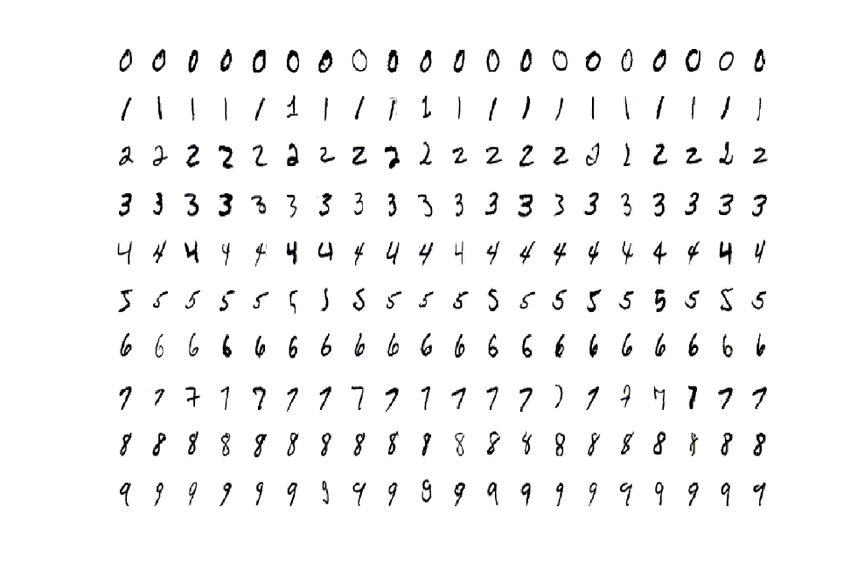

The basic idea beyond GANs is based on the creation of two models, a discriminator and a generator.
- **Generator:** is the model which has to generate the images from noise, it is composed by several blocks of a combination of linear,batch,relu each one.
- **Discriminator:** this model has to predict if a given image is real or fake.

## Generator block:
This is the basic brick which the generator is composed by.

In [5]:
import torch
from torch import nn

def get_generator_block(input_dim,output_dim):
  """Returns a generator block
  Parameters:
  - input_dim (int): dimension of the input vectora
  - output_dim (int): dimension of the outpute vectora
  Retruns
  - tensor      
  """
  return nn.Sequential(
      nn.Linear(input_dim, output_dim),
      nn.BatchNorm1d(output_dim),
      nn.ReLU(inplace=True),
  )

## Generator model
This model recives a noise vector wich is the seed to create the new images and returns an new image.

In [6]:
class Generator(nn.Module):
  def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
    """
    z_dim (int): the dimension of the noise vector.
    im_dim (int): the dimension of the images, fitted for the dataset used. (MNIST images are 28 x 28 = 784 so that is your default)
    hidden_dim (int): the inner dimension.
    """
    super(Generator, self).__init__()
    self.gen = nn.Sequential(
        get_generator_block(z_dim, hidden_dim),
        get_generator_block(hidden_dim, hidden_dim * 2),
        get_generator_block(hidden_dim * 2, hidden_dim * 4),
        get_generator_block(hidden_dim * 4, hidden_dim * 8),
        nn.Linear( hidden_dim * 8, im_dim),
        nn.Sigmoid()
    )
  def forward(self, noise):
    '''
    Function for completing a forward pass of the generator: Given a noise tensor, 
    returns generated images.
    Parameters:
        noise: a noise tensor with dimensions (n_samples, z_dim)
    '''
    return self.gen(noise)  

## Generate noise

This function allaw us to create noise image to feed our generator

In [7]:
def get_noise(n_samples, z_dim, device='cpu'):
  '''
  Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
  creates a tensor of that shape filled with random numbers from the normal distribution.
  Parameters:
    n_samples: the number of samples to generate, a scalar
    z_dim: the dimension of the noise vector, a scalar
    device: the device type
  '''
  return torch.randn(n_samples,z_dim,device=device)
  
  

## Discriminator block

In [8]:
def get_discriminator_block(input_dim,output_dim):
  """
  Discriminator Block
  Function for returning a neural network of the discriminator given input and output dimensions.
  Parameters:
  - input_dim (int): the dimension of the input vector
  - output_dim (int: the dimension of the output vector
  Returns:
      a discriminator neural network layer, with a linear transformation 
        followed by an nn.LeakyReLU activation with negative slope of 0.2 
  """
  return nn.Sequential(
      nn.Linear(input_dim,output_dim),
      nn.LeakyReLU(negative_slope=0.2)
  )

## Discriminator model

In [9]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim,1)            
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)

## Losses

### Discriminator loss
These are the steps to create the generator loss
1.  Create noise vectors 
2.  Generate a batch (num_images) of fake images. It is important to detach the generator gradients.
4.  Get the discriminator's prediction of the fake image.
3.  Calculate the loss of the discriminator. 
  - Get the  discriminator's prediction of the fake image and calculate the loss. 
  -  Get the discriminator's prediction of the real image and calculate the loss. 
  - Calculate the discriminator's loss by averaging the real and fake loss
and set it to disc_loss. $loss = \frac{DiscLoss + GenLoss}{2}$



In [23]:
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
  '''
  Return the loss of the discriminator given inputs.
  Parameters:
      gen: the generator model, which returns an image given z-dimensional noise
      disc: the discriminator model, which returns a single-dimensional prediction of real/fake
      criterion: the loss function, which should be used to compare 
            the discriminator's predictions to the ground truth reality of the images 
            (e.g. fake = 0, real = 1)
      real: a batch of real images
      num_images: the number of images the generator should produce, 
              which is also the length of the real images
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
  Returns:
      disc_loss: a torch scalar loss value for the current batch
  '''
  #generate noise
  noise = get_noise(num_images, z_dim, device)

  #generate fake images
  fake_img = gen(noise).detach()

  #pass the fake images to the discriminator
  disc_fake = disc(fake_img)

  #calculate the loss using as growntrue "0s" becuase all images are fake
  disc_loss_fake = criterion(disc_fake,torch.zeros_like(disc_fake))

  #pass the real images to the discriminator
  disc_real = disc(real)

  #calculate the using the as growntrue "1s" because all images are real
  disc_loss_real = criterion(disc_real, torch.ones_like(disc_real))

  #return the avarege between both
  return (disc_loss_fake+disc_loss_real)/2




### Generator loss
These are the steps you will need to complete:
1. Create noise vectors.
2. Generate a batch of fake images. 
3. Get the discriminator's prediction of the fake image.
4. Calculate the generator's loss. Remember the generator wants the discriminator to think that its fake images are real


In [24]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
  '''
  Return the loss of the generator given inputs.
  Parameters:
    gen: the generator model, which returns an image given z-dimensional noise
    disc: the discriminator model, which returns a single-dimensional prediction of real/fake
    criterion: the loss function, which should be used to compare 
            the discriminator's predictions to the ground truth reality of the images 
            (e.g. fake = 0, real = 1)
    num_images: the number of images the generator should produce, 
            which is also the length of the real images
    z_dim: the dimension of the noise vector, a scalar
    device: the device type
  Returns:
    gen_loss: a torch scalar loss value for the current batch
  '''
  #Generate the noise
  noise = get_noise(num_images,z_dim,device)
  
  #Predict generate the image
  gen_pred = gen(noise)

  #Discrimine the image into fake and real
  disc_pred = disc(gen_pred)

  #return the loss based on the criterion and using ones since the generator needs the discrimintor 
  return  criterion(disc_pred, torch.ones_like(disc_pred))


This is a helper function to show the generated images

In [27]:
from torchvision.utils import make_grid
import matplotlib.pyplot as plt

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

## Training
Now, we set up our parameters
  *   criterion: the loss function
  *   n_epochs: the number of times we iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.

In [21]:
from torch.utils.data import DataLoader
from torchvision.datasets import MNIST # Training dataset
from torchvision import transforms

# Set parameters
criterion = nn.BCEWithLogitsLoss() 
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

device = 'cuda:0'

Now we initialize our model

In [22]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Epoch 1, step 500: Generator loss: 1.722038241386412, discriminator loss: 0.292706658780575


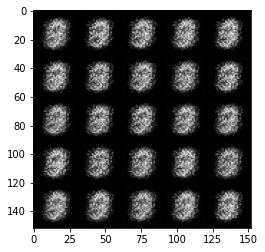

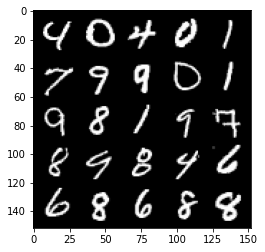

Epoch 2, step 1000: Generator loss: 2.0159811596870427, discriminator loss: 0.16920364528894424


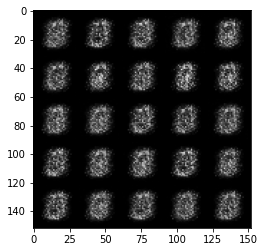

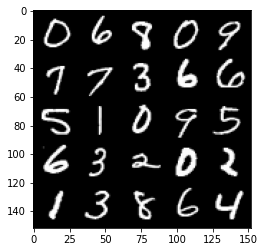

Epoch 3, step 1500: Generator loss: 1.7587556753158555, discriminator loss: 0.20154578965902323


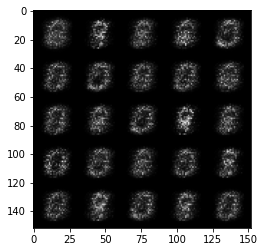

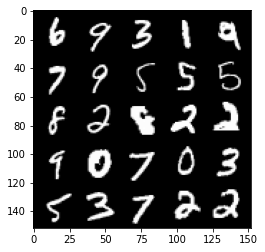

Epoch 4, step 2000: Generator loss: 1.6477879273891438, discriminator loss: 0.21849980354309073


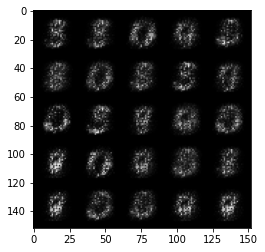

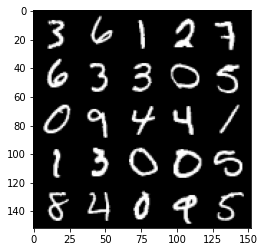

Epoch 5, step 2500: Generator loss: 1.8193347387313843, discriminator loss: 0.18655376642942453


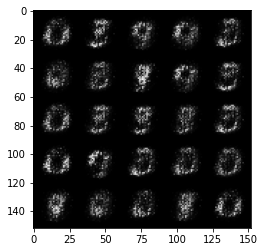

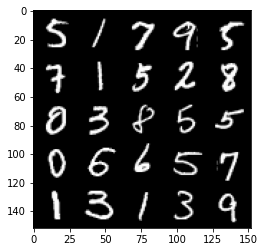

Epoch 6, step 3000: Generator loss: 2.2813190262317655, discriminator loss: 0.13346479514241208


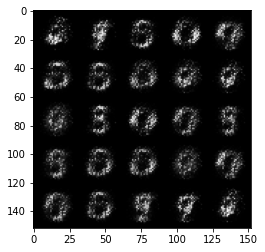

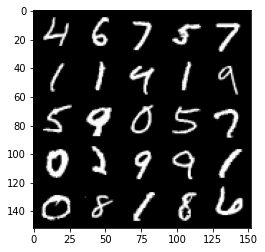

Epoch 7, step 3500: Generator loss: 2.7203675551414483, discriminator loss: 0.10589971528947346


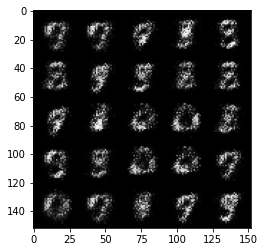

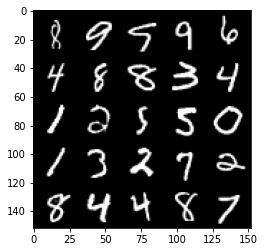

Epoch 8, step 4000: Generator loss: 3.0968682069778435, discriminator loss: 0.08780451664328584


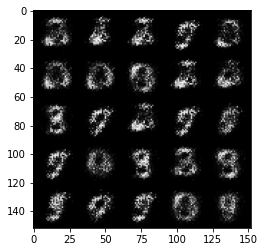

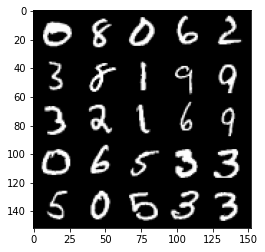

Epoch 9, step 4500: Generator loss: 3.3264585752487172, discriminator loss: 0.08339869483560333


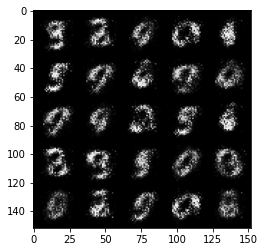

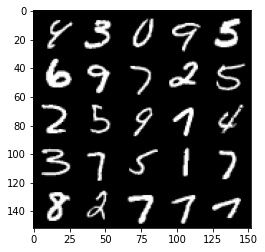

Epoch 10, step 5000: Generator loss: 3.618233559608464, discriminator loss: 0.07824230671674014


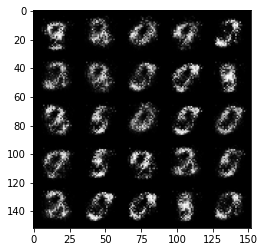

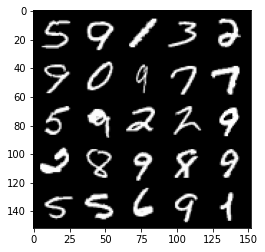

Epoch 11, step 5500: Generator loss: 3.705653521537779, discriminator loss: 0.08092742614448067


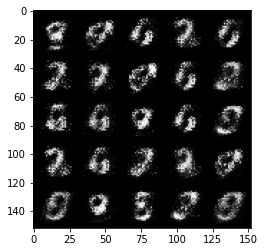

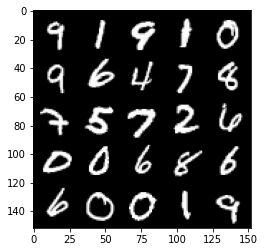

Epoch 12, step 6000: Generator loss: 3.809711586952211, discriminator loss: 0.06925169994682073


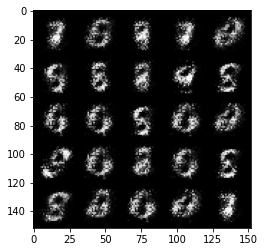

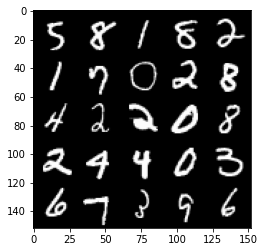

Epoch 13, step 6500: Generator loss: 4.1000484352111775, discriminator loss: 0.06749262088537218


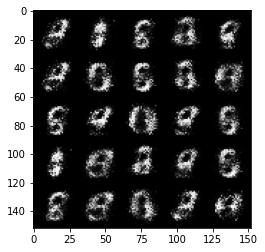

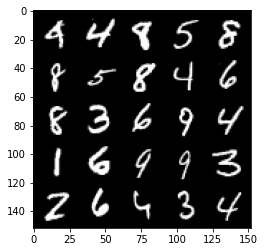

Epoch 14, step 7000: Generator loss: 4.214806071758269, discriminator loss: 0.05500754860416051


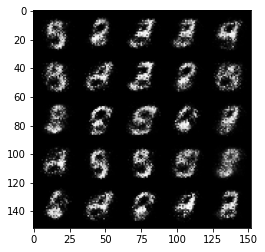

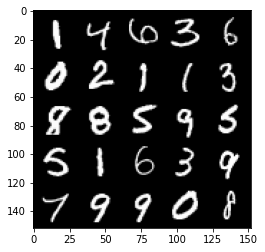

Epoch 15, step 7500: Generator loss: 4.066678016185758, discriminator loss: 0.054172057732939746


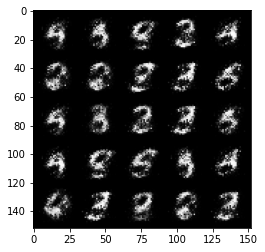

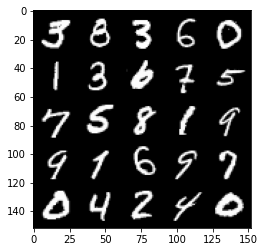

Epoch 17, step 8000: Generator loss: 4.043834358215331, discriminator loss: 0.04851050753146413


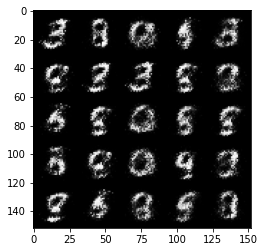

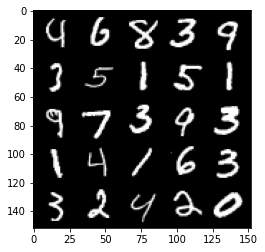

Epoch 18, step 8500: Generator loss: 4.493749804019927, discriminator loss: 0.038047721453011024


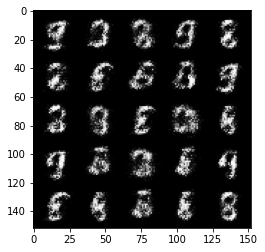

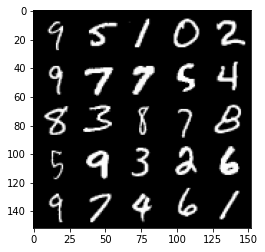

Epoch 19, step 9000: Generator loss: 4.282943397045135, discriminator loss: 0.05426545315235854


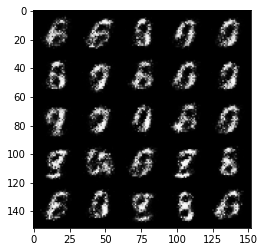

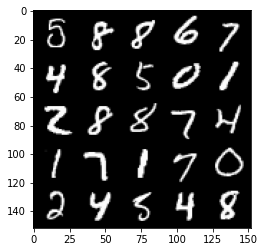

Epoch 20, step 9500: Generator loss: 4.177969802379604, discriminator loss: 0.05306988511979581


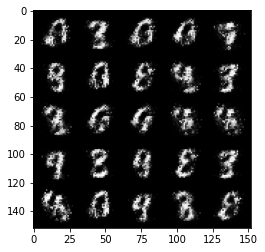

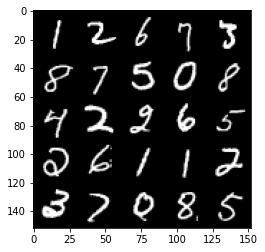

Epoch 21, step 10000: Generator loss: 4.11567250442505, discriminator loss: 0.06198363655060533


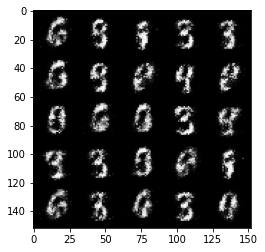

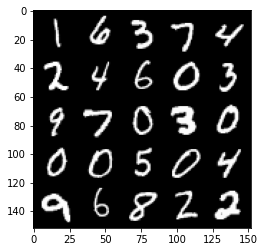

Epoch 22, step 10500: Generator loss: 4.163729389667508, discriminator loss: 0.06290123818814748


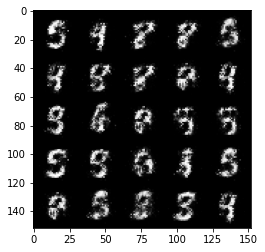

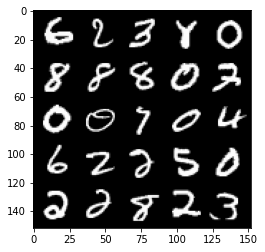

Epoch 23, step 11000: Generator loss: 4.205359812259673, discriminator loss: 0.060051622875034835


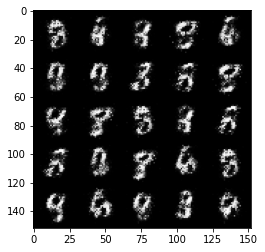

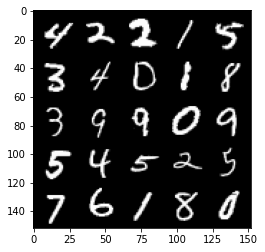

Epoch 24, step 11500: Generator loss: 4.293027339935299, discriminator loss: 0.07400349196046595


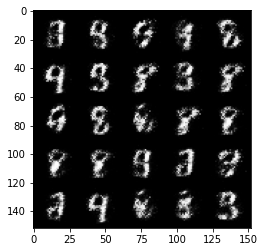

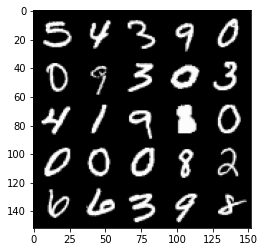

Epoch 25, step 12000: Generator loss: 4.17400211048126, discriminator loss: 0.07504657595232121


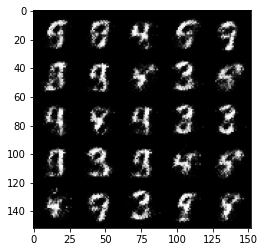

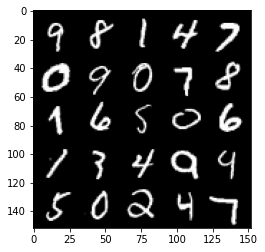

Epoch 26, step 12500: Generator loss: 4.143729516506194, discriminator loss: 0.07344945872202514


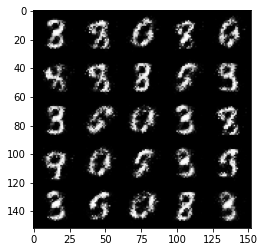

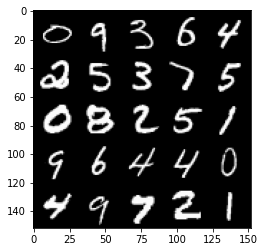

Epoch 27, step 13000: Generator loss: 4.065003873348236, discriminator loss: 0.07923735974729049


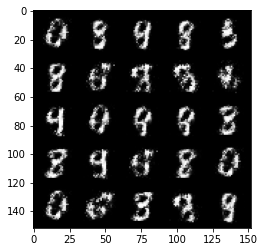

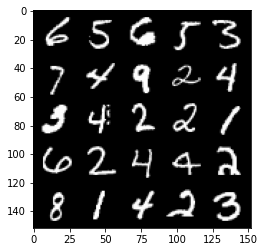

Epoch 28, step 13500: Generator loss: 3.8746409521102887, discriminator loss: 0.08231930347532032


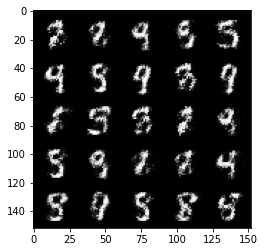

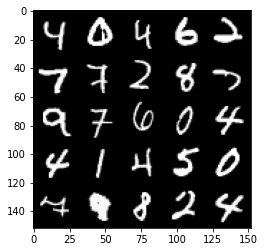

Epoch 29, step 14000: Generator loss: 3.9178907065391546, discriminator loss: 0.08669965481013062


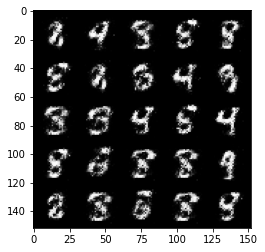

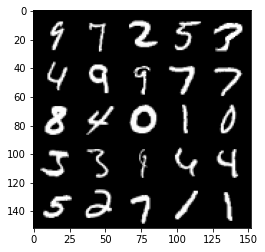

Epoch 30, step 14500: Generator loss: 3.924321659088133, discriminator loss: 0.10091323279589405


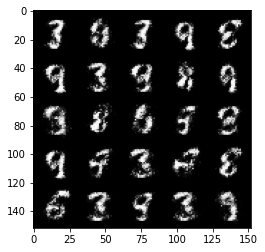

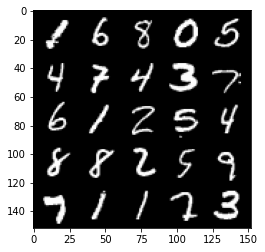

Epoch 31, step 15000: Generator loss: 3.876585369110105, discriminator loss: 0.08759101804345845


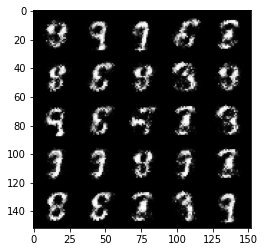

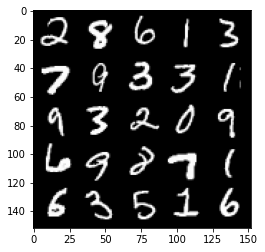

Epoch 33, step 15500: Generator loss: 4.010743371009825, discriminator loss: 0.09910816806554784


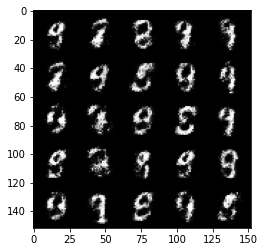

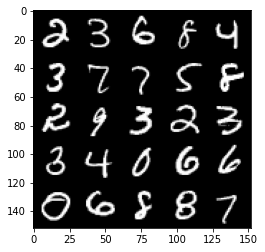

Epoch 34, step 16000: Generator loss: 3.9117253932952813, discriminator loss: 0.09655707410722968


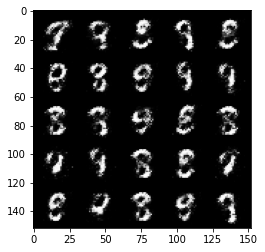

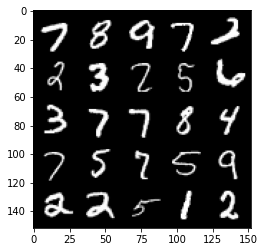

Epoch 35, step 16500: Generator loss: 3.844077043056486, discriminator loss: 0.10011702357977627


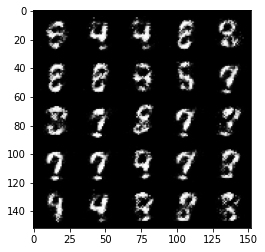

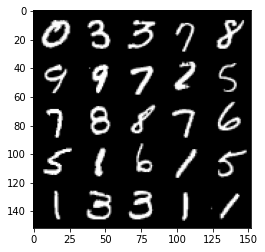

Epoch 36, step 17000: Generator loss: 3.820177639007569, discriminator loss: 0.10438741052895784


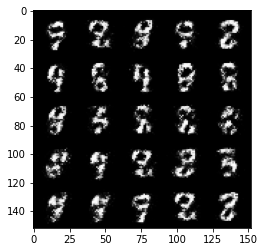

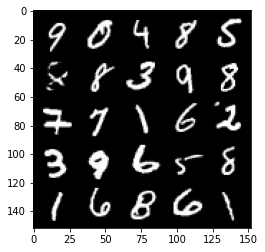

Epoch 37, step 17500: Generator loss: 3.7624462633132914, discriminator loss: 0.11557106624543678


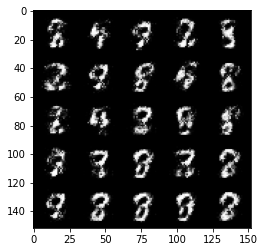

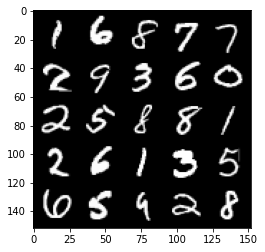

Epoch 38, step 18000: Generator loss: 3.498664847373966, discriminator loss: 0.13955925202369698


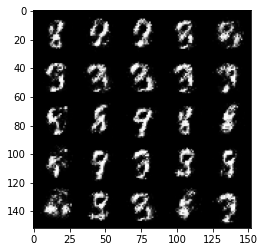

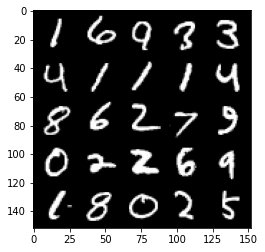

Epoch 39, step 18500: Generator loss: 3.6579363780021676, discriminator loss: 0.12727615543454884


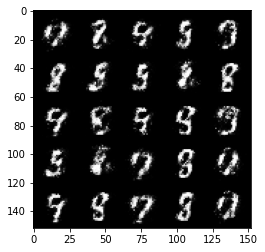

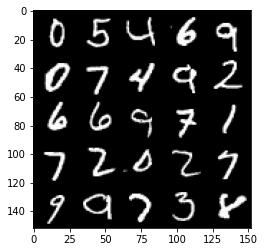

Epoch 40, step 19000: Generator loss: 3.6210041303634646, discriminator loss: 0.12775125816464414


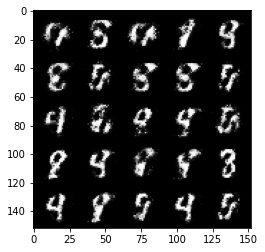

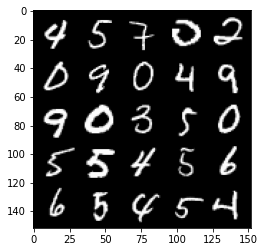

Epoch 41, step 19500: Generator loss: 3.6491596617698674, discriminator loss: 0.12315158474445353


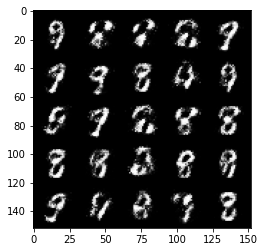

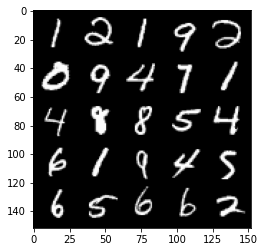

Epoch 42, step 20000: Generator loss: 3.526598876953123, discriminator loss: 0.13206131429970275


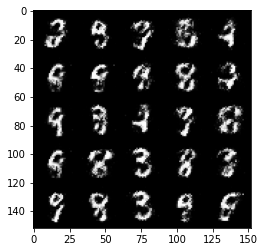

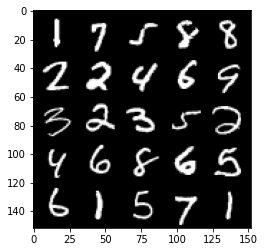

Epoch 43, step 20500: Generator loss: 3.5176149883270265, discriminator loss: 0.13719908237457282


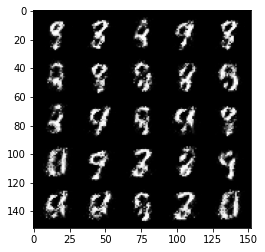

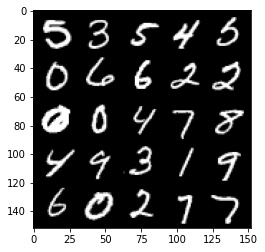

Epoch 44, step 21000: Generator loss: 3.495360892772676, discriminator loss: 0.1425252625644208


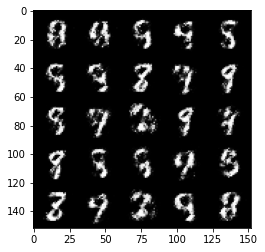

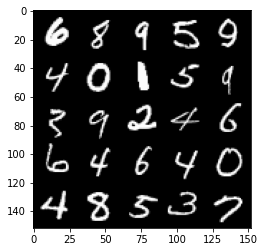

Epoch 45, step 21500: Generator loss: 3.3883169755935647, discriminator loss: 0.15325707171857356


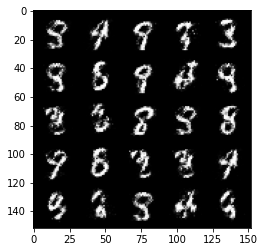

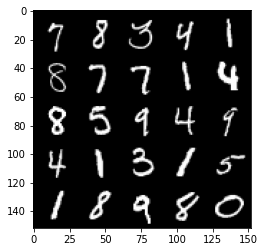

Epoch 46, step 22000: Generator loss: 3.2771503701209994, discriminator loss: 0.16031035771965993


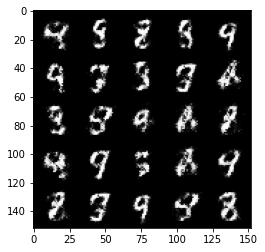

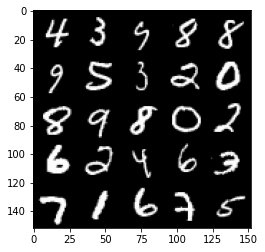

Epoch 47, step 22500: Generator loss: 3.333630889892577, discriminator loss: 0.15930886422097684


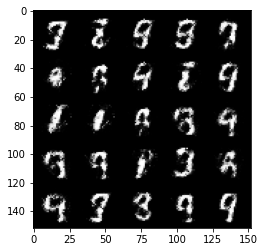

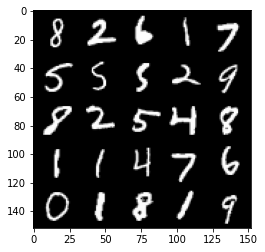

Epoch 49, step 23000: Generator loss: 3.256873771667476, discriminator loss: 0.17370348158478735


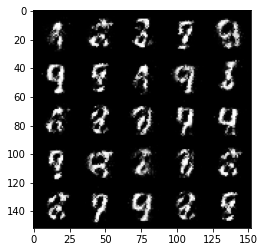

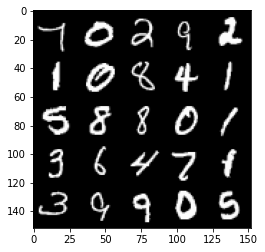

Epoch 50, step 23500: Generator loss: 3.2311019339561446, discriminator loss: 0.18010761444270604


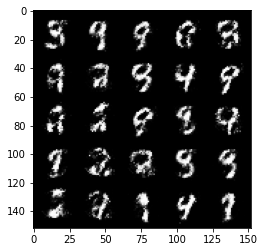

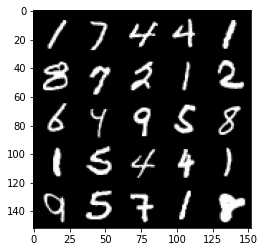

Epoch 51, step 24000: Generator loss: 3.2936892199516326, discriminator loss: 0.15727415744960305


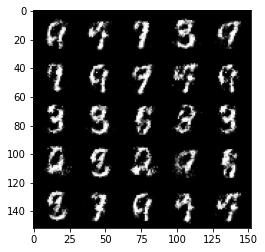

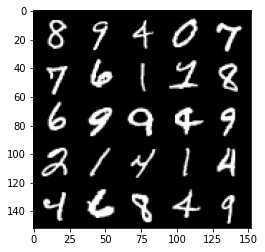

Epoch 52, step 24500: Generator loss: 3.048018150806427, discriminator loss: 0.18658751557767378


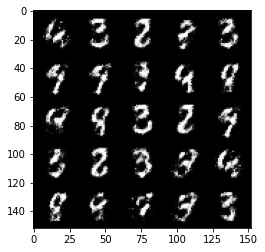

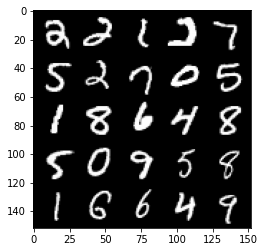

Epoch 53, step 25000: Generator loss: 3.0251317415237415, discriminator loss: 0.16767327761650094


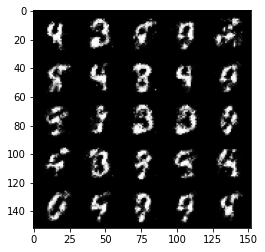

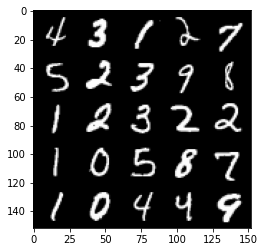

Epoch 54, step 25500: Generator loss: 3.1726894321441628, discriminator loss: 0.16836345833539965


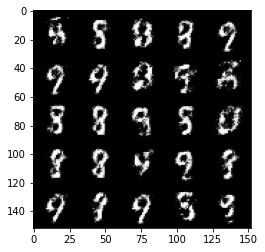

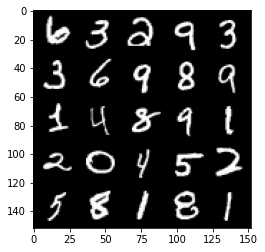

Epoch 55, step 26000: Generator loss: 3.241673495769498, discriminator loss: 0.16217525912821296


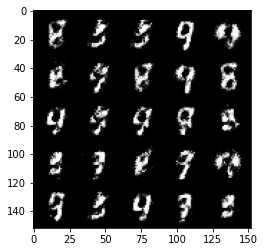

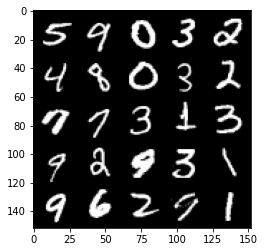

Epoch 56, step 26500: Generator loss: 3.082166207790372, discriminator loss: 0.1597938211113215


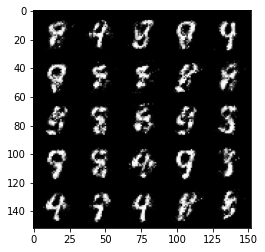

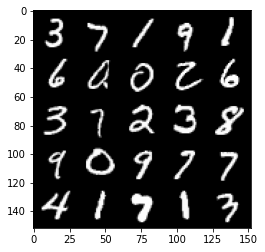

Epoch 57, step 27000: Generator loss: 3.14868565797806, discriminator loss: 0.16308121570944797


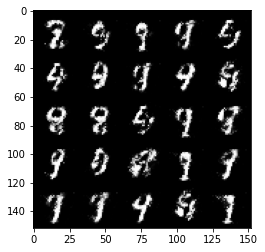

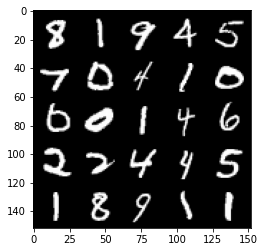

Epoch 58, step 27500: Generator loss: 3.102177655696868, discriminator loss: 0.17284447596967212


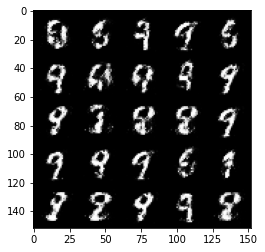

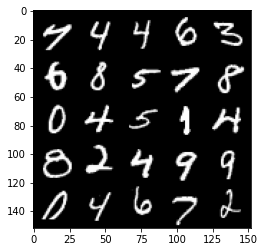

Epoch 59, step 28000: Generator loss: 3.0576396660804743, discriminator loss: 0.1787943263351918


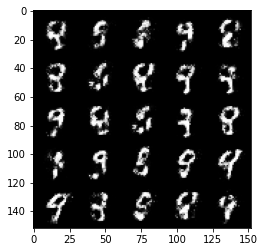

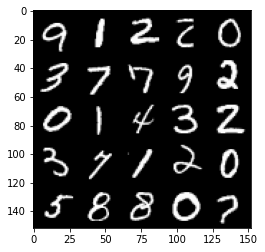

Epoch 60, step 28500: Generator loss: 3.0887781324386596, discriminator loss: 0.17545513255894213


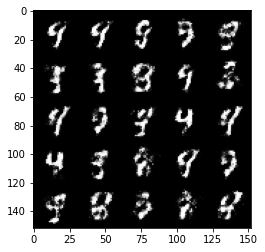

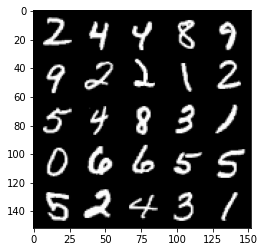

Epoch 61, step 29000: Generator loss: 3.2128167567253105, discriminator loss: 0.15619877313077454


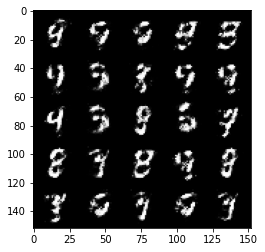

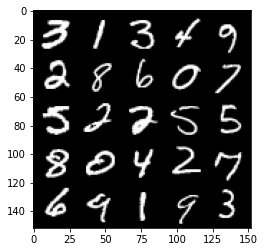

Epoch 62, step 29500: Generator loss: 3.140926274776458, discriminator loss: 0.1736611114591361


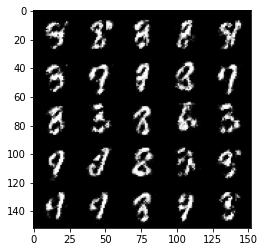

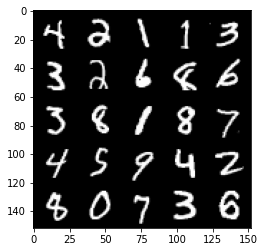

Epoch 63, step 30000: Generator loss: 2.860617805957798, discriminator loss: 0.20069781495630767


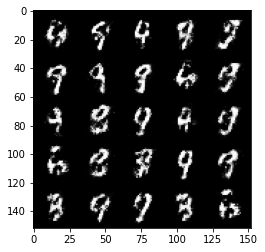

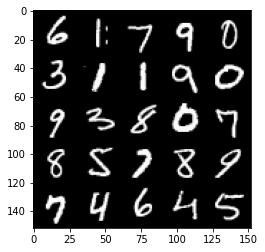

Epoch 65, step 30500: Generator loss: 2.8144173402786263, discriminator loss: 0.2112156952917575


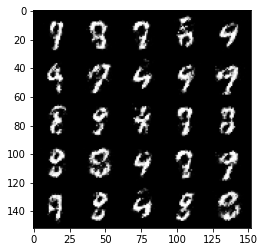

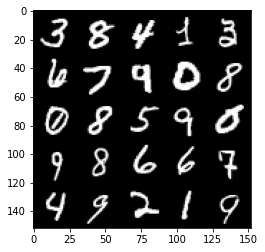

Epoch 66, step 31000: Generator loss: 2.8661170992851273, discriminator loss: 0.19696223826706413


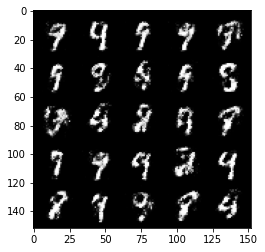

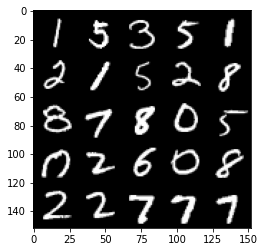

Epoch 67, step 31500: Generator loss: 2.828549360275272, discriminator loss: 0.1980314186513424


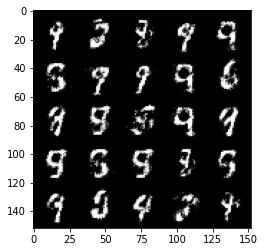

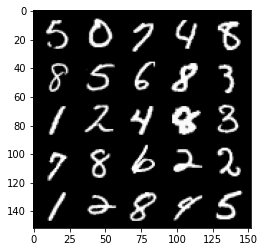

Epoch 68, step 32000: Generator loss: 2.8060960164070123, discriminator loss: 0.22100039862096307


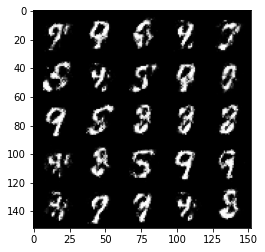

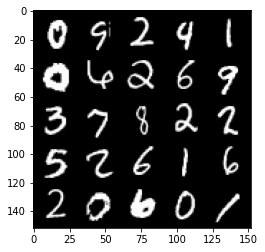

Epoch 69, step 32500: Generator loss: 2.6044021105766304, discriminator loss: 0.23966785791516315


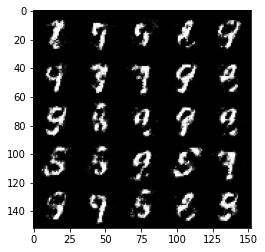

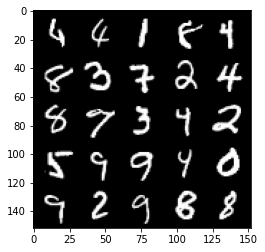

Epoch 70, step 33000: Generator loss: 2.5904106822013877, discriminator loss: 0.23477917374670484


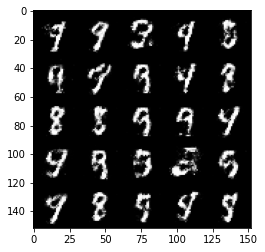

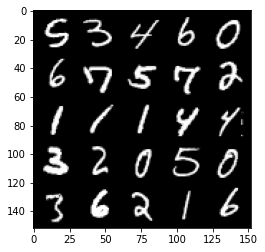

Epoch 71, step 33500: Generator loss: 2.6975830130577076, discriminator loss: 0.21329834419488897


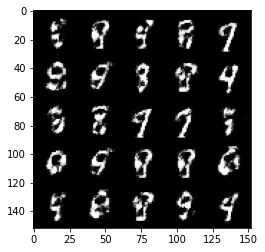

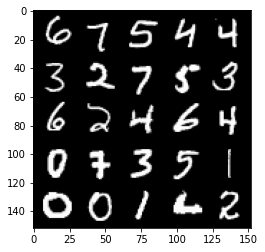

Epoch 72, step 34000: Generator loss: 2.661309722423554, discriminator loss: 0.2250967683941125


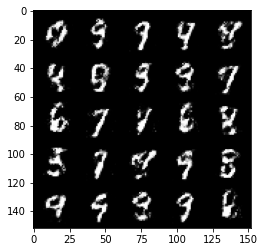

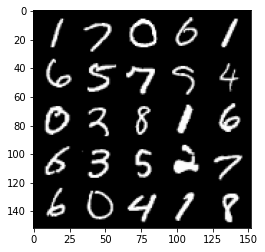

Epoch 73, step 34500: Generator loss: 2.561508956909181, discriminator loss: 0.22831178858876228


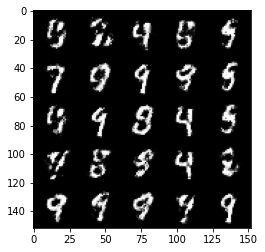

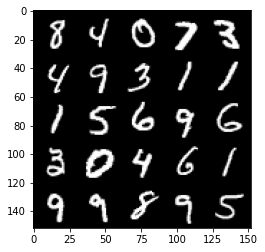

Epoch 74, step 35000: Generator loss: 2.6142054324150066, discriminator loss: 0.2273448832333089


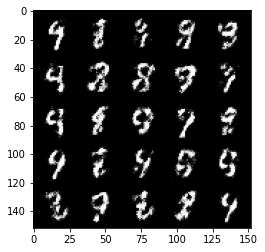

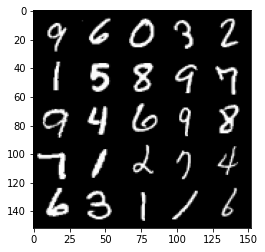

Epoch 75, step 35500: Generator loss: 2.597674541950227, discriminator loss: 0.23270266571640968


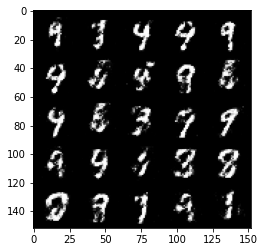

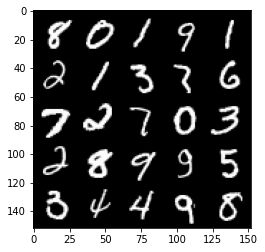

Epoch 76, step 36000: Generator loss: 2.4864269177913667, discriminator loss: 0.23753854480385794


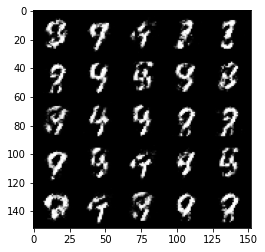

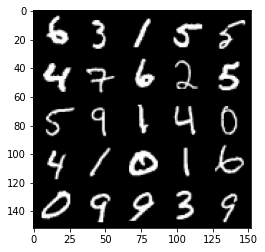

Epoch 77, step 36500: Generator loss: 2.54811995601654, discriminator loss: 0.2194554703831676


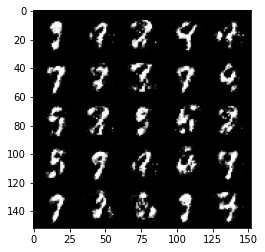

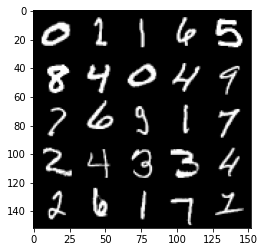

Epoch 78, step 37000: Generator loss: 2.549226907730105, discriminator loss: 0.2358797248452901


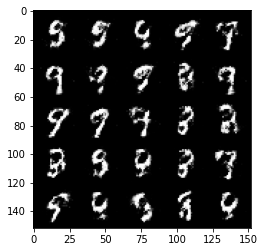

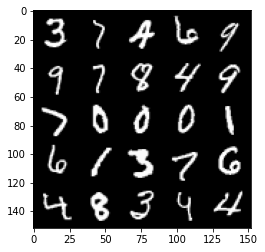

Epoch 79, step 37500: Generator loss: 2.4972179679870607, discriminator loss: 0.23293435245752325


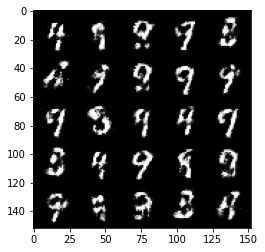

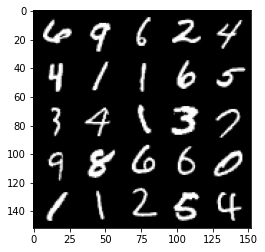

Epoch 81, step 38000: Generator loss: 2.4997578203678152, discriminator loss: 0.24674538844823854


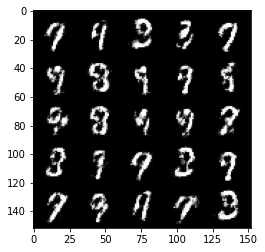

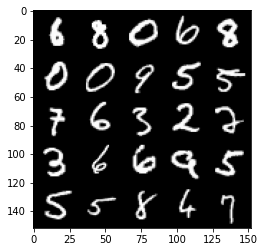

Epoch 82, step 38500: Generator loss: 2.5406144642829886, discriminator loss: 0.2329698033332821


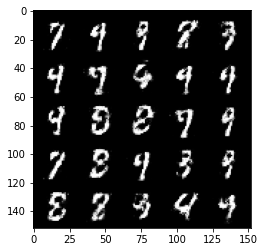

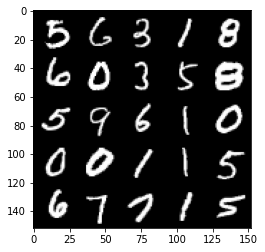

Epoch 83, step 39000: Generator loss: 2.5561808509826656, discriminator loss: 0.23403354331850992


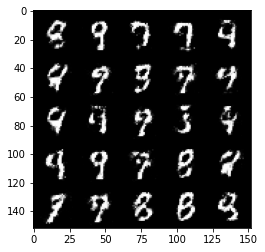

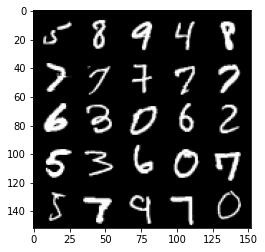

Epoch 84, step 39500: Generator loss: 2.4534152317047124, discriminator loss: 0.2466856863200664


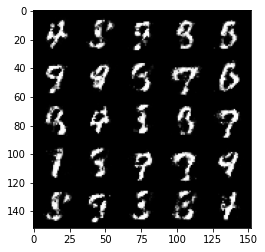

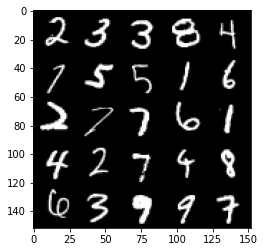

Epoch 85, step 40000: Generator loss: 2.382399689674376, discriminator loss: 0.2553324118852617


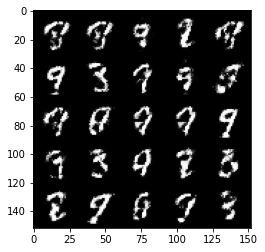

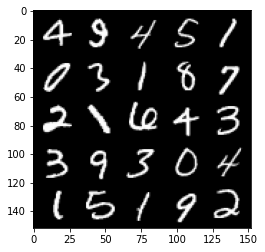

Epoch 86, step 40500: Generator loss: 2.4142515301704393, discriminator loss: 0.2467059127390384


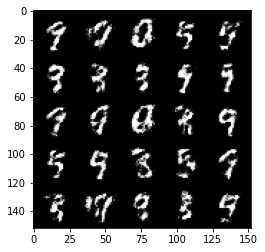

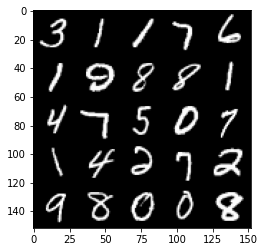

Epoch 87, step 41000: Generator loss: 2.4863740084171275, discriminator loss: 0.24459241241216656


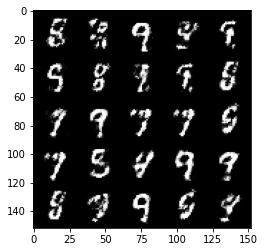

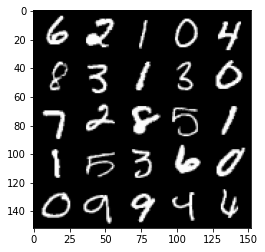

Epoch 88, step 41500: Generator loss: 2.339807319164278, discriminator loss: 0.26215112930536266


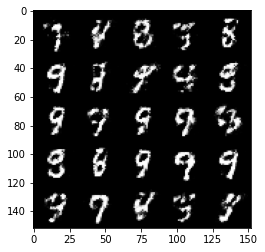

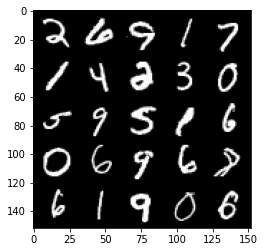

Epoch 89, step 42000: Generator loss: 2.2536614904403685, discriminator loss: 0.2701231117844581


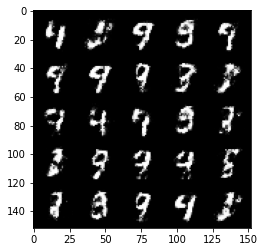

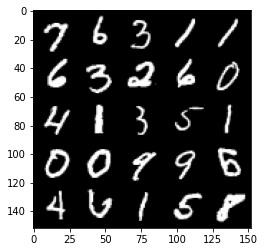

Epoch 90, step 42500: Generator loss: 2.37062651014328, discriminator loss: 0.2507060295045378


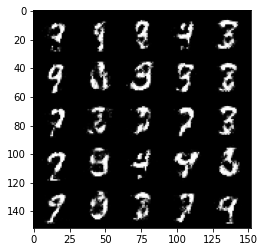

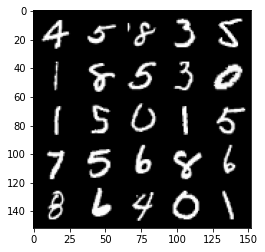

Epoch 91, step 43000: Generator loss: 2.455399083137512, discriminator loss: 0.2358219857811927


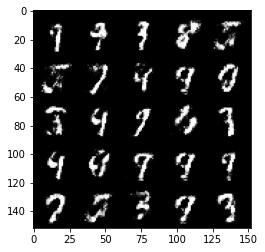

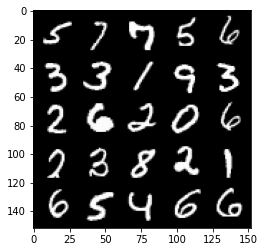

Epoch 92, step 43500: Generator loss: 2.2993779666423793, discriminator loss: 0.2740744773447512


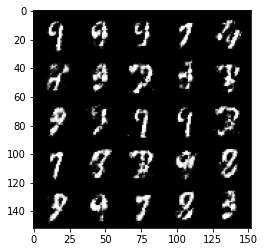

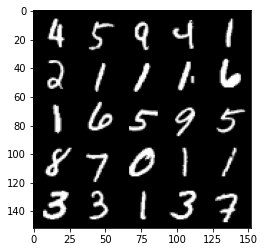

Epoch 93, step 44000: Generator loss: 2.245335698604583, discriminator loss: 0.28920094588398926


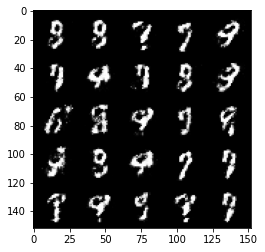

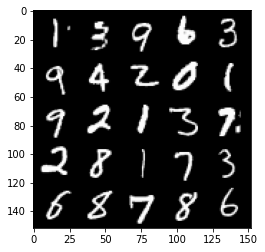

Epoch 94, step 44500: Generator loss: 2.3770352349281296, discriminator loss: 0.2584964894652366


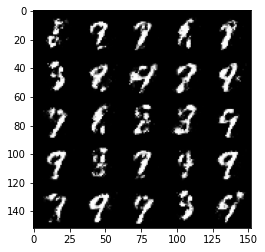

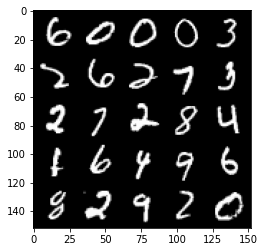

Epoch 95, step 45000: Generator loss: 2.333921384334566, discriminator loss: 0.2695744281709193


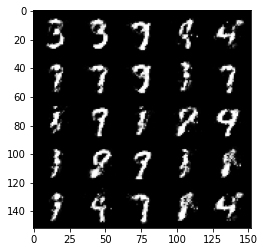

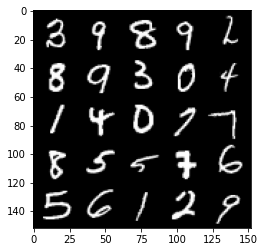

Epoch 97, step 45500: Generator loss: 2.2364623527526866, discriminator loss: 0.2868811389207841


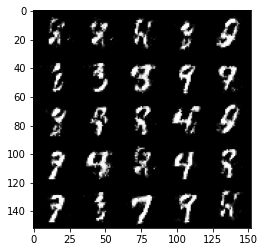

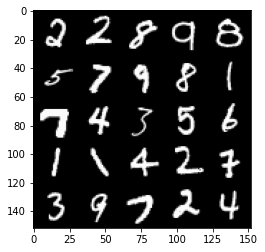

Epoch 98, step 46000: Generator loss: 2.1826588103771196, discriminator loss: 0.2985336574912068


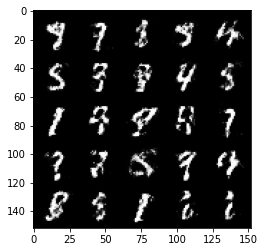

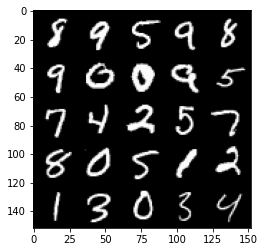

Epoch 99, step 46500: Generator loss: 2.182665379285814, discriminator loss: 0.28602861383557343


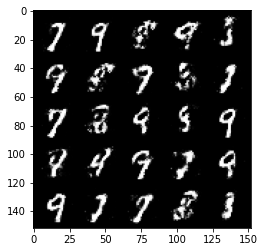

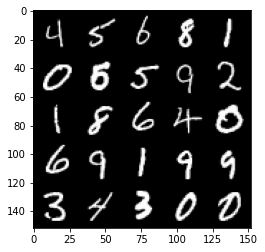

Epoch 100, step 47000: Generator loss: 2.2108886458873735, discriminator loss: 0.29347779303789123


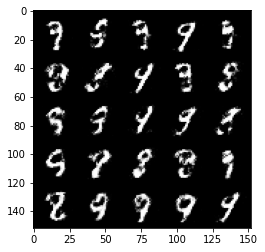

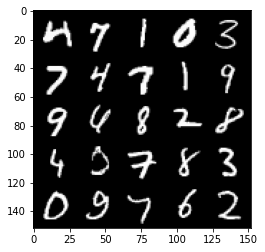

Epoch 101, step 47500: Generator loss: 2.177328189373017, discriminator loss: 0.29979679465293896


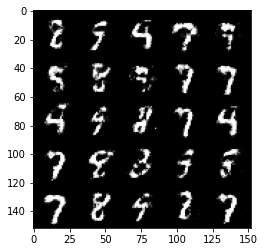

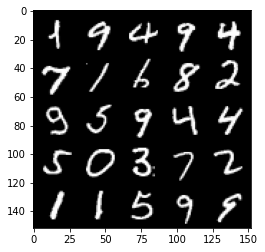

Epoch 102, step 48000: Generator loss: 2.0985102427005757, discriminator loss: 0.2947458156645301


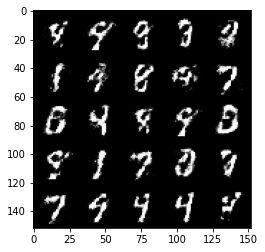

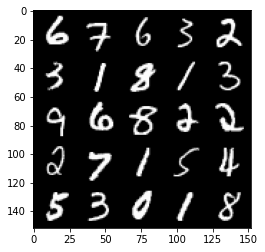

Epoch 103, step 48500: Generator loss: 2.1976912670135507, discriminator loss: 0.284420493096113


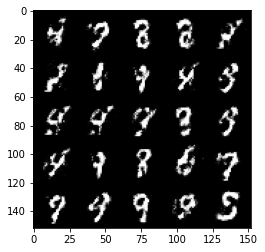

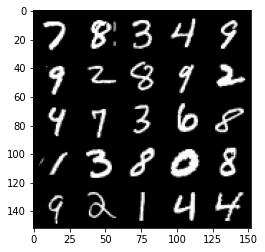

Epoch 104, step 49000: Generator loss: 2.1220001714229566, discriminator loss: 0.29376748055219654


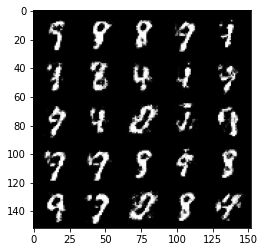

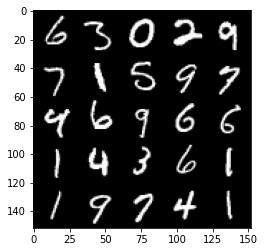

Epoch 105, step 49500: Generator loss: 2.06612867283821, discriminator loss: 0.3045451556146144


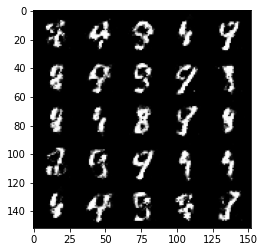

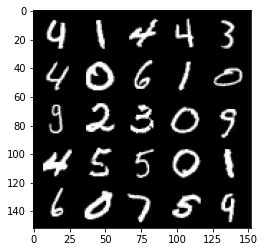

Epoch 106, step 50000: Generator loss: 2.08610311102867, discriminator loss: 0.3004511209130286


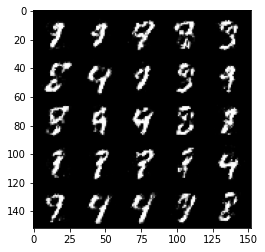

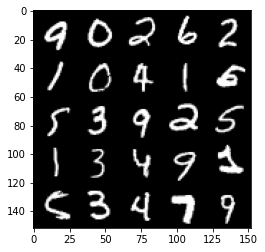

Epoch 107, step 50500: Generator loss: 2.1830799243450163, discriminator loss: 0.29074794068932536


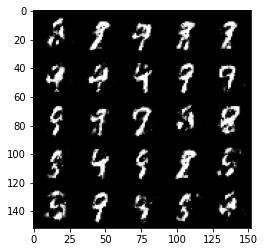

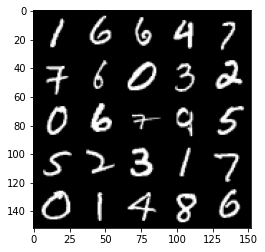

Epoch 108, step 51000: Generator loss: 2.052070806980133, discriminator loss: 0.3147424091398717


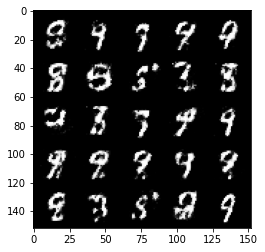

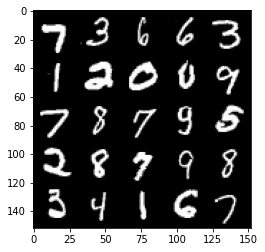

Epoch 109, step 51500: Generator loss: 2.126156351566315, discriminator loss: 0.29649382656812673


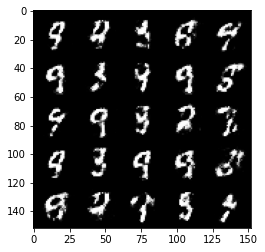

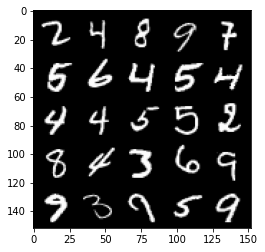

Epoch 110, step 52000: Generator loss: 2.1936010191440576, discriminator loss: 0.28071351653337495


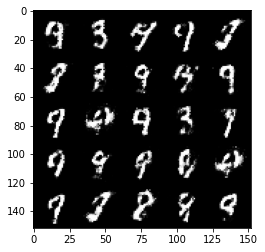

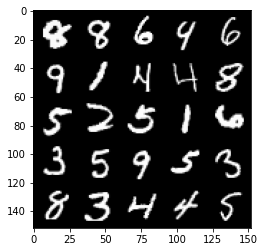

Epoch 111, step 52500: Generator loss: 1.9932231810092933, discriminator loss: 0.3320735062956808


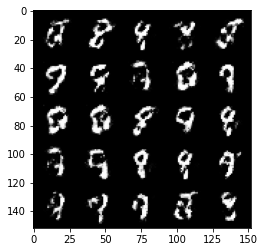

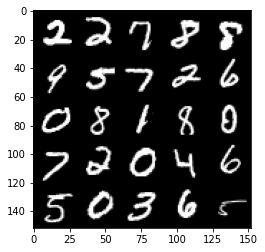

Epoch 113, step 53000: Generator loss: 1.9300035002231595, discriminator loss: 0.33572998043894786


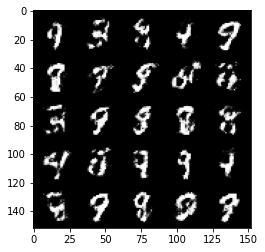

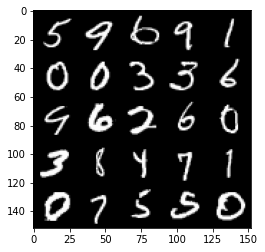

Epoch 114, step 53500: Generator loss: 1.9773264670372, discriminator loss: 0.32711412301659587


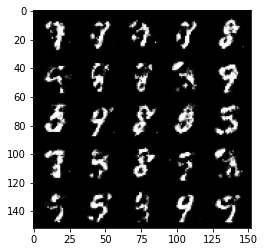

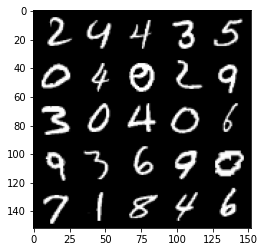

Epoch 115, step 54000: Generator loss: 1.9389258694648766, discriminator loss: 0.3361672300398348


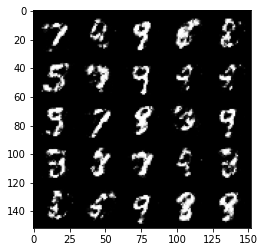

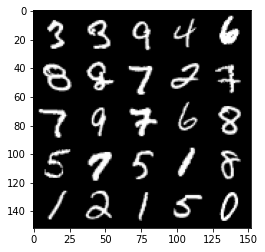

Epoch 116, step 54500: Generator loss: 1.9720381641387927, discriminator loss: 0.31494413667917265


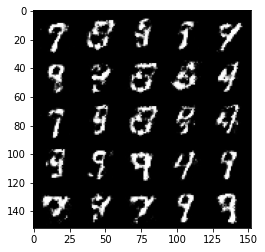

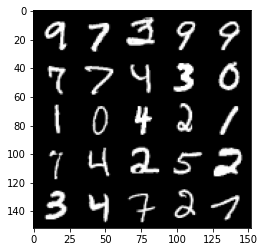

Epoch 117, step 55000: Generator loss: 2.0353186829090126, discriminator loss: 0.30418491643667217


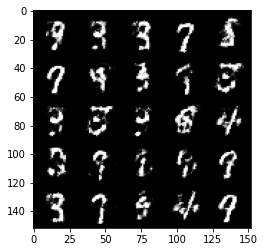

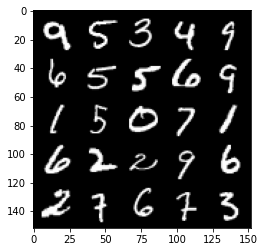

Epoch 118, step 55500: Generator loss: 2.0183204913139328, discriminator loss: 0.3157302700281145


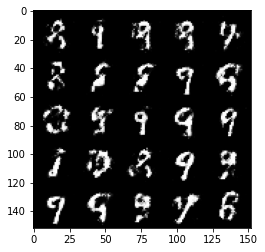

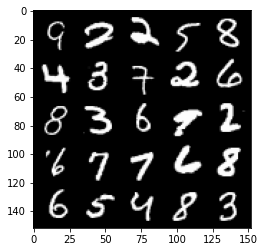

Epoch 119, step 56000: Generator loss: 1.913066985845564, discriminator loss: 0.3440942558050159


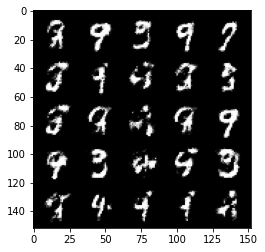

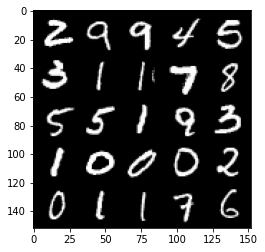

Epoch 120, step 56500: Generator loss: 1.8370754487514493, discriminator loss: 0.3509414659142495


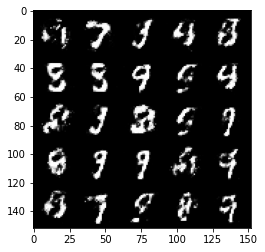

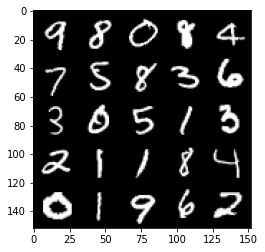

Epoch 121, step 57000: Generator loss: 1.7907478952407834, discriminator loss: 0.3580334807038307


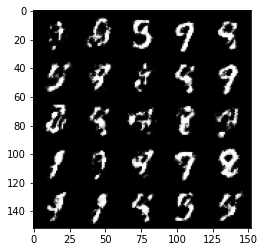

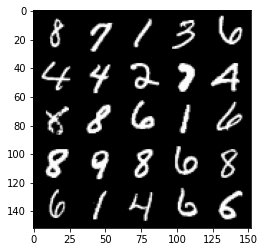

Epoch 122, step 57500: Generator loss: 1.7943677685260782, discriminator loss: 0.3529311250448228


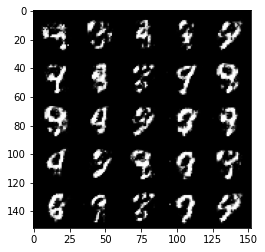

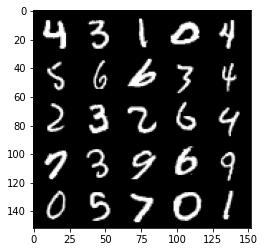

Epoch 123, step 58000: Generator loss: 1.8742074763774894, discriminator loss: 0.340711142241955


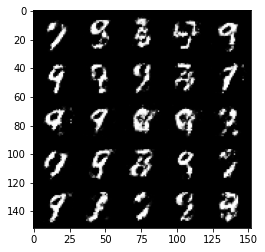

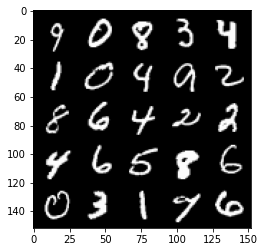

Epoch 124, step 58500: Generator loss: 1.7973573369979858, discriminator loss: 0.3642283844351767


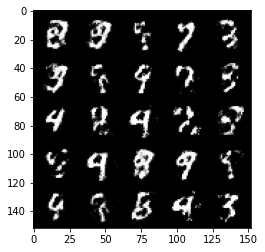

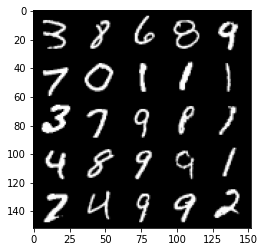

Epoch 125, step 59000: Generator loss: 1.7091940655708304, discriminator loss: 0.3807506423592569


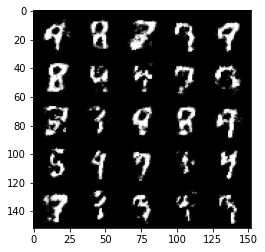

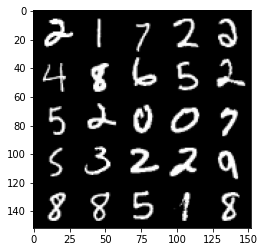

Epoch 126, step 59500: Generator loss: 1.7810659079551685, discriminator loss: 0.3463603758811954


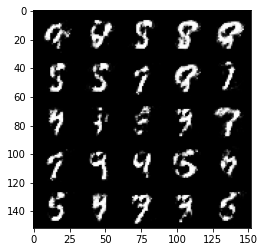

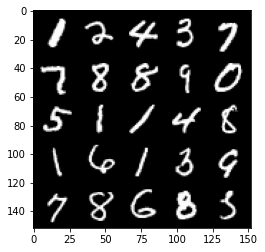

Epoch 127, step 60000: Generator loss: 1.7719540095329291, discriminator loss: 0.3532949975132944


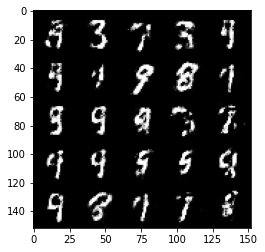

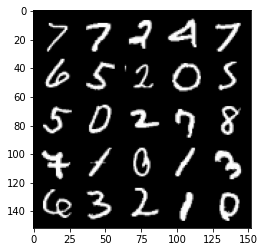

Epoch 128, step 60500: Generator loss: 1.7479534275531785, discriminator loss: 0.37188301789760586


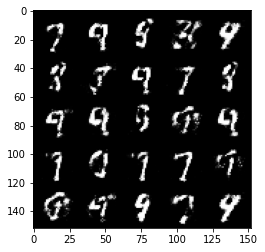

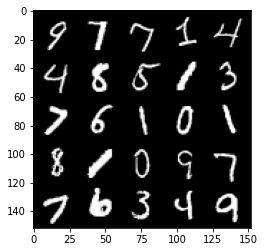

Epoch 130, step 61000: Generator loss: 1.6900712504386894, discriminator loss: 0.37167768788337713


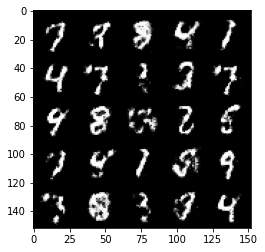

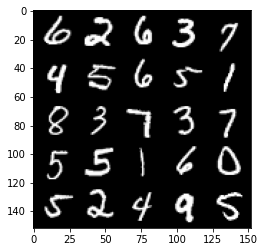

Epoch 131, step 61500: Generator loss: 1.7463380308151233, discriminator loss: 0.36562870180606855


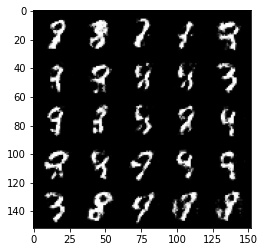

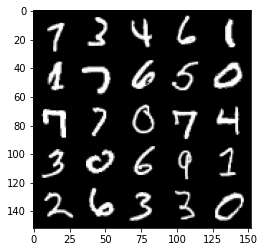

Epoch 132, step 62000: Generator loss: 1.7965857670307157, discriminator loss: 0.3629035504162311


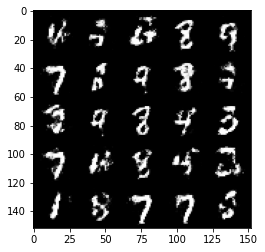

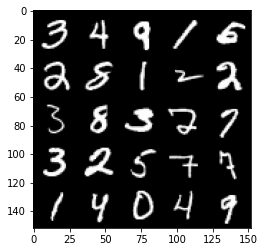

Epoch 133, step 62500: Generator loss: 1.7548774721622458, discriminator loss: 0.36085776019096366


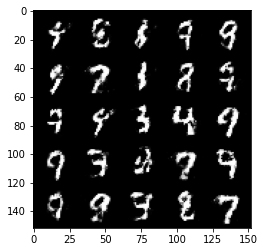

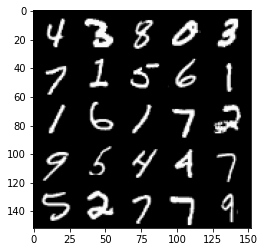

Epoch 134, step 63000: Generator loss: 1.6877577688693999, discriminator loss: 0.38238674610853185


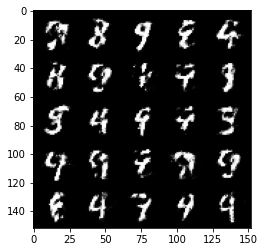

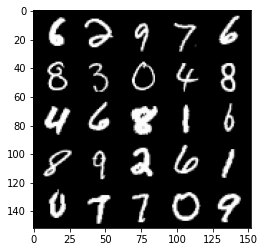

Epoch 135, step 63500: Generator loss: 1.736324740648268, discriminator loss: 0.3729105070829393


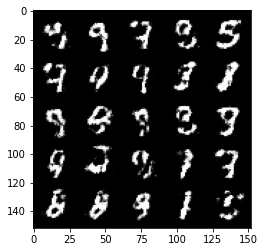

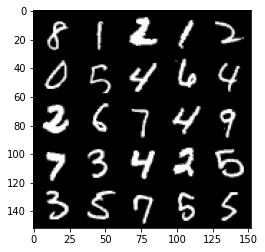

Epoch 136, step 64000: Generator loss: 1.6097740089893346, discriminator loss: 0.40677815359830866


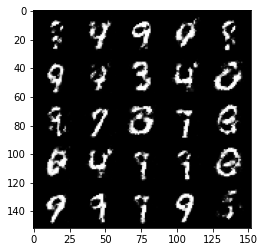

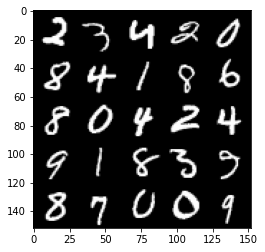

Epoch 137, step 64500: Generator loss: 1.5702325358390812, discriminator loss: 0.40984178417920997


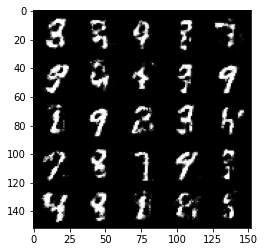

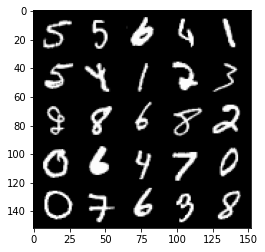

Epoch 138, step 65000: Generator loss: 1.577833812236786, discriminator loss: 0.4075412700772288


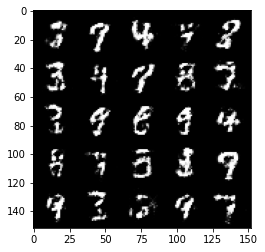

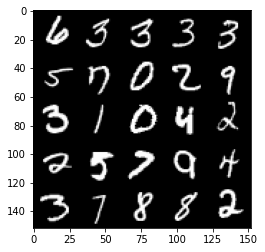

Epoch 139, step 65500: Generator loss: 1.5666895561218253, discriminator loss: 0.4087531668543823


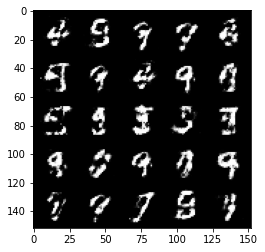

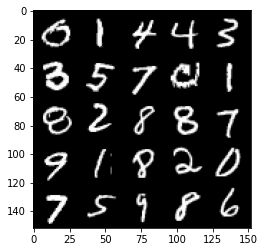

Epoch 140, step 66000: Generator loss: 1.625745784997939, discriminator loss: 0.4025789521336553


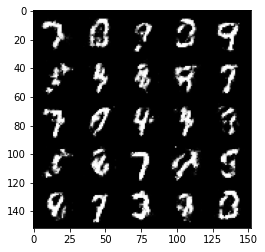

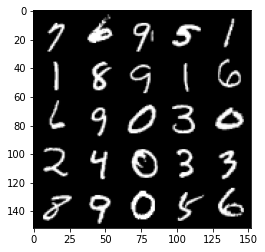

Epoch 141, step 66500: Generator loss: 1.5860357446670543, discriminator loss: 0.41453553503751733


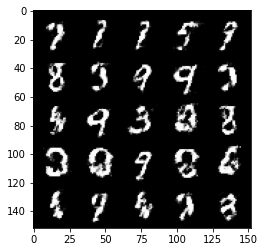

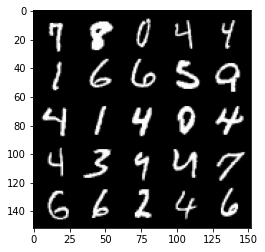

Epoch 142, step 67000: Generator loss: 1.605830198764801, discriminator loss: 0.4045756625533103


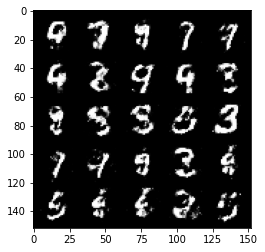

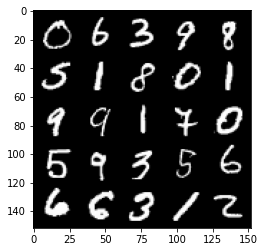

Epoch 143, step 67500: Generator loss: 1.5751930372714997, discriminator loss: 0.40633295851945894


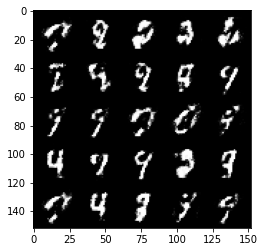

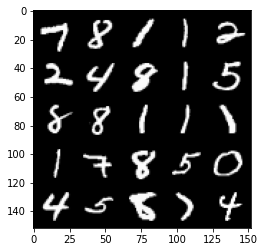

Epoch 144, step 68000: Generator loss: 1.599372686862944, discriminator loss: 0.4049742357730867


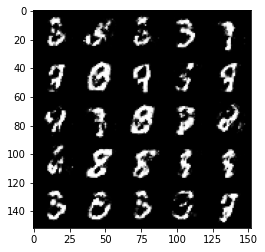

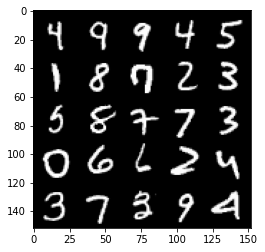

Epoch 146, step 68500: Generator loss: 1.5510950164794934, discriminator loss: 0.4105455767512319


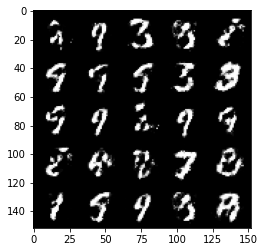

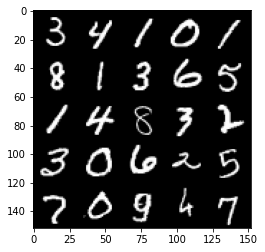

Epoch 147, step 69000: Generator loss: 1.5882665197849264, discriminator loss: 0.39169704008102413


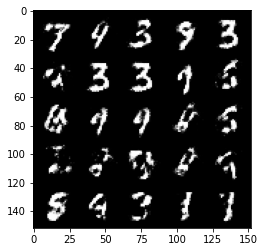

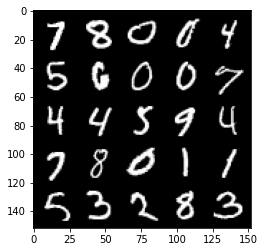

Epoch 148, step 69500: Generator loss: 1.5107504854202258, discriminator loss: 0.4119295647144321


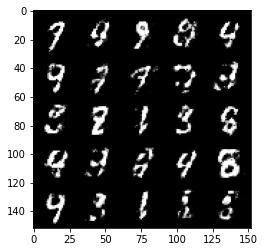

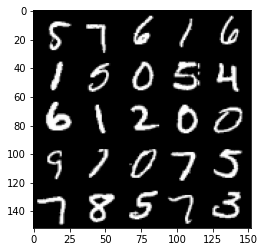

Epoch 149, step 70000: Generator loss: 1.4914592895507812, discriminator loss: 0.4280607715249061


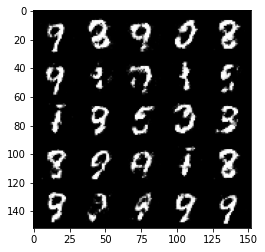

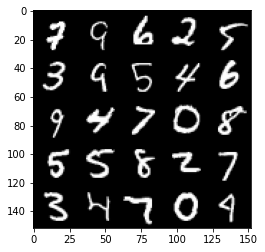

Epoch 150, step 70500: Generator loss: 1.5936333632469173, discriminator loss: 0.406187746465206


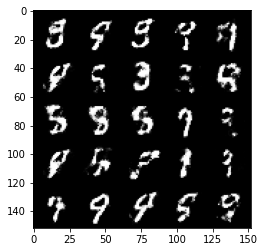

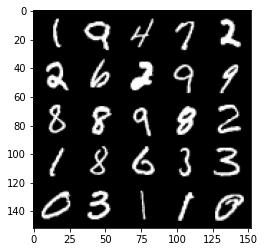

Epoch 151, step 71000: Generator loss: 1.550351471185684, discriminator loss: 0.42164243072271373


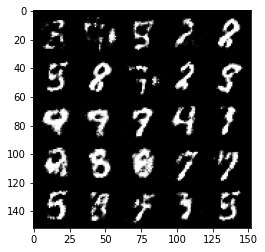

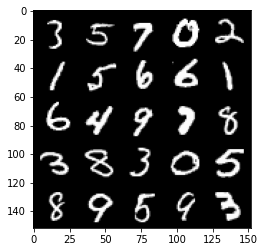

Epoch 152, step 71500: Generator loss: 1.475338054418564, discriminator loss: 0.4267869170308117


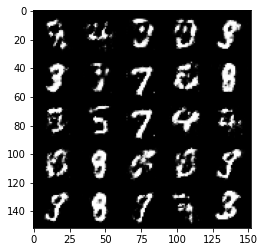

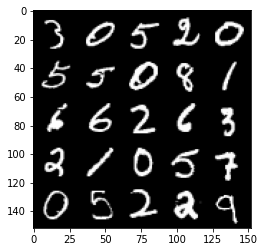

Epoch 153, step 72000: Generator loss: 1.4873614757060991, discriminator loss: 0.4350270504355432


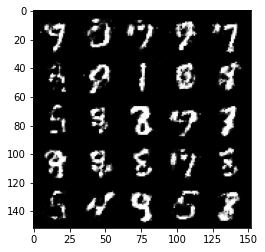

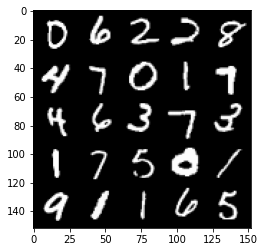

Epoch 154, step 72500: Generator loss: 1.4962555947303766, discriminator loss: 0.41187670207023647


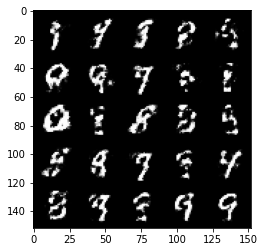

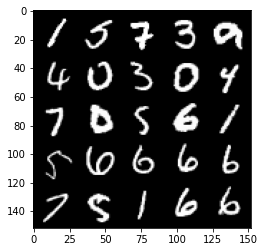

Epoch 155, step 73000: Generator loss: 1.5620739877223964, discriminator loss: 0.4068353813886645


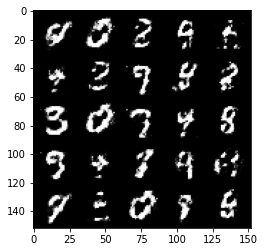

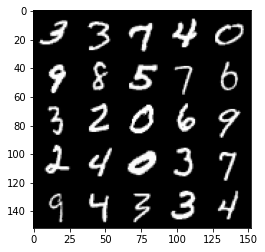

Epoch 156, step 73500: Generator loss: 1.5969122648239136, discriminator loss: 0.3962996347546578


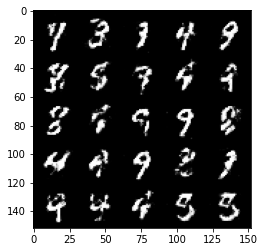

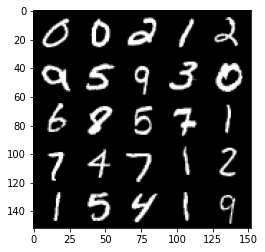

Epoch 157, step 74000: Generator loss: 1.4839546902179714, discriminator loss: 0.43249715238809583


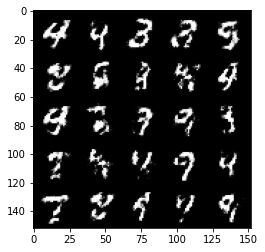

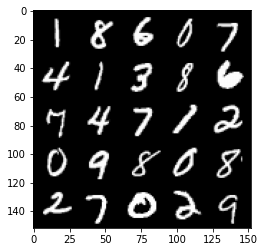

Epoch 158, step 74500: Generator loss: 1.48994885802269, discriminator loss: 0.4215035194158558


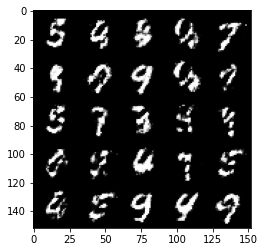

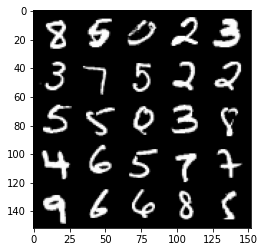

Epoch 159, step 75000: Generator loss: 1.5612067062854769, discriminator loss: 0.41135999089479447


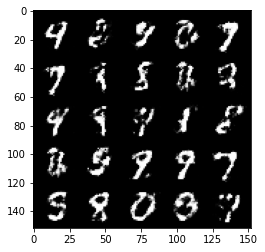

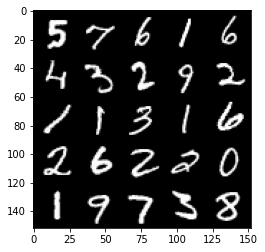

Epoch 160, step 75500: Generator loss: 1.4735027086734782, discriminator loss: 0.4297894362211232


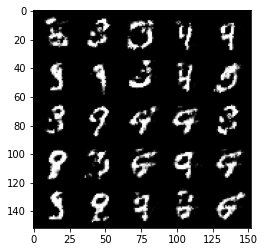

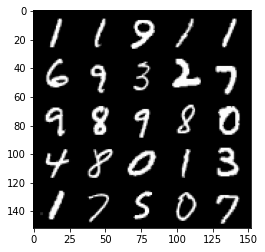

Epoch 162, step 76000: Generator loss: 1.5409481379985799, discriminator loss: 0.41663930040597935


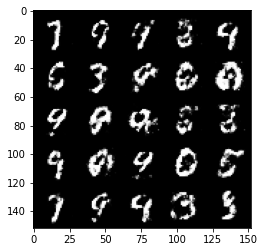

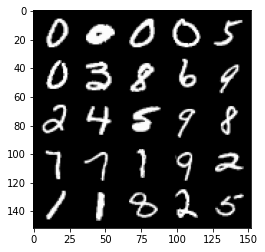

Epoch 163, step 76500: Generator loss: 1.4300982420444477, discriminator loss: 0.42969473117589974


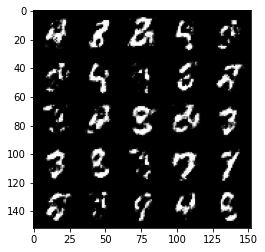

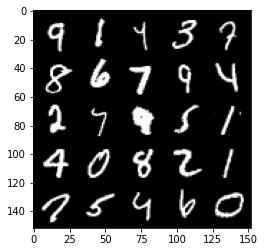

Epoch 164, step 77000: Generator loss: 1.5570058097839365, discriminator loss: 0.40077840334177034


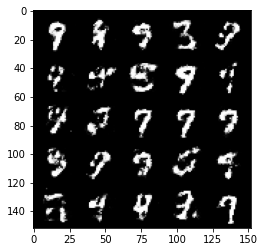

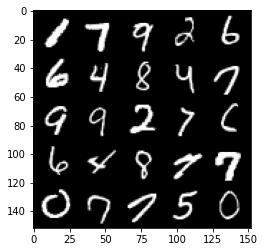

Epoch 165, step 77500: Generator loss: 1.5302879984378832, discriminator loss: 0.4169577188491825


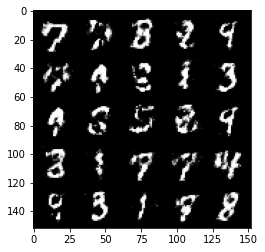

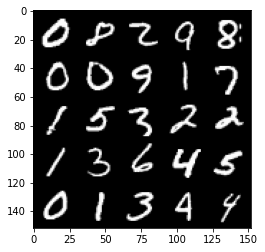

Epoch 166, step 78000: Generator loss: 1.4501558058261879, discriminator loss: 0.4382467778325084


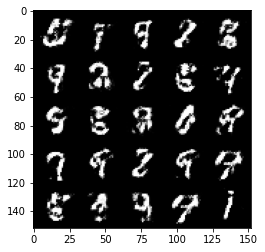

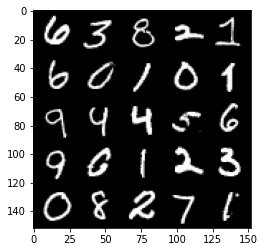

Epoch 167, step 78500: Generator loss: 1.5478139874935128, discriminator loss: 0.4149747933149339


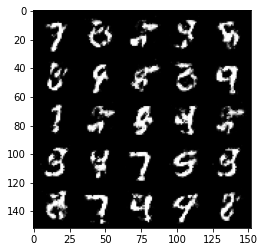

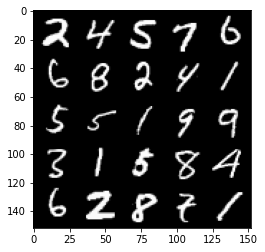

Epoch 168, step 79000: Generator loss: 1.5584936649799352, discriminator loss: 0.4089591349363327


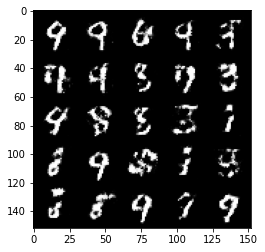

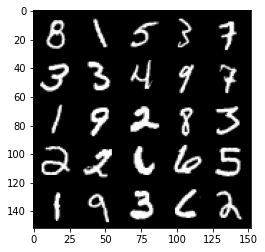

Epoch 169, step 79500: Generator loss: 1.5332565019130708, discriminator loss: 0.41790807241201433


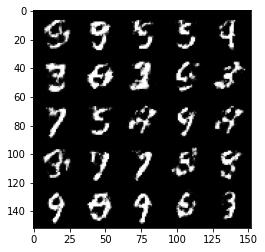

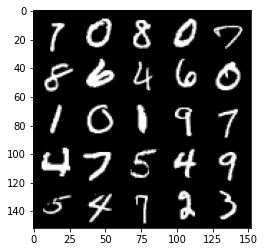

Epoch 170, step 80000: Generator loss: 1.4008335368633267, discriminator loss: 0.44907803243398653


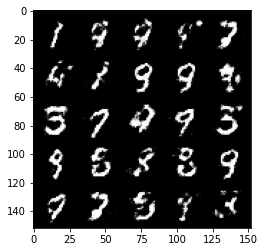

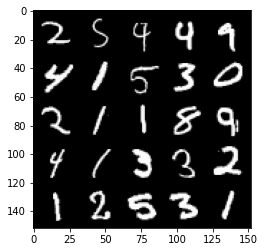

Epoch 171, step 80500: Generator loss: 1.4438405022621168, discriminator loss: 0.4367948069572445


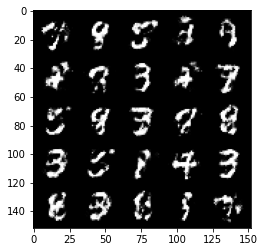

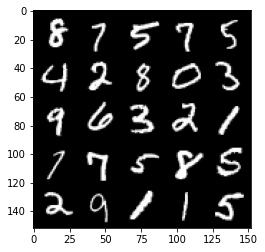

Epoch 172, step 81000: Generator loss: 1.4186137700080894, discriminator loss: 0.45166756868362445


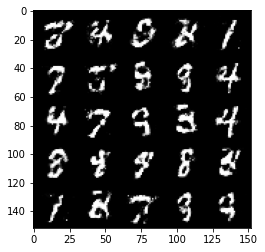

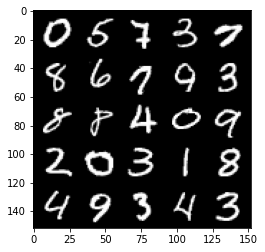

Epoch 173, step 81500: Generator loss: 1.4959732446670528, discriminator loss: 0.4184417527914045


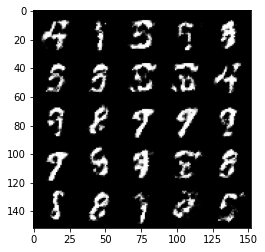

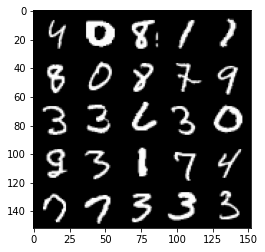

Epoch 174, step 82000: Generator loss: 1.3694490842819205, discriminator loss: 0.46347823882103


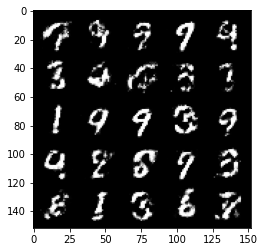

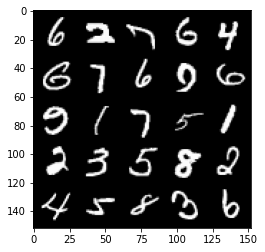

Epoch 175, step 82500: Generator loss: 1.33360171341896, discriminator loss: 0.45825042074918754


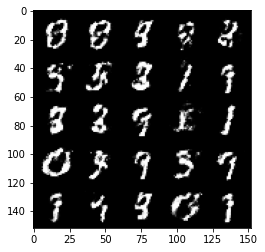

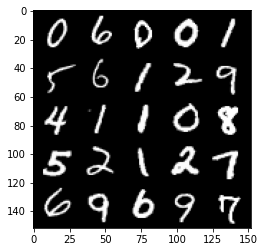

Epoch 176, step 83000: Generator loss: 1.4077626702785495, discriminator loss: 0.4499406437277794


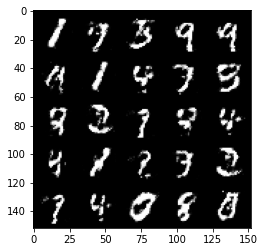

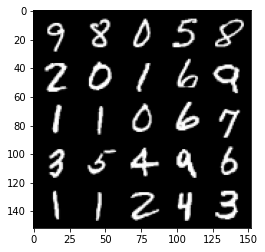

Epoch 178, step 83500: Generator loss: 1.4195116839408874, discriminator loss: 0.43104317384958285


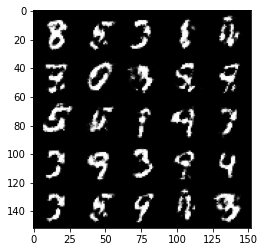

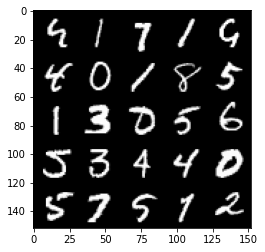

Epoch 179, step 84000: Generator loss: 1.3310194113254536, discriminator loss: 0.47175843280553775


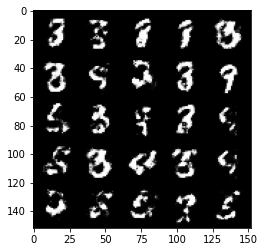

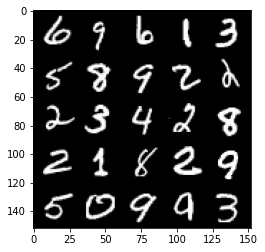

Epoch 180, step 84500: Generator loss: 1.327831134319305, discriminator loss: 0.4618297028541563


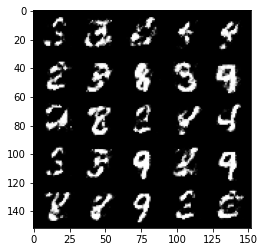

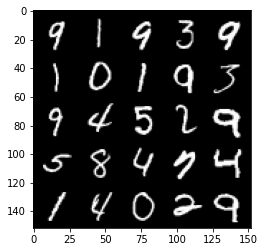

Epoch 181, step 85000: Generator loss: 1.3971952667236336, discriminator loss: 0.4481866469383242


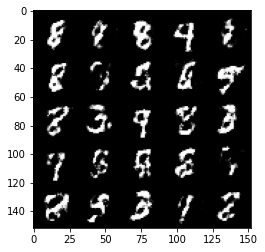

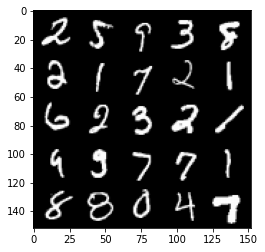

Epoch 182, step 85500: Generator loss: 1.4198104491233823, discriminator loss: 0.4445785197019577


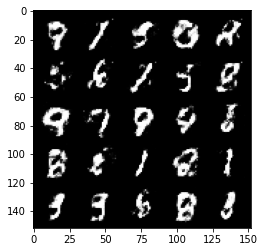

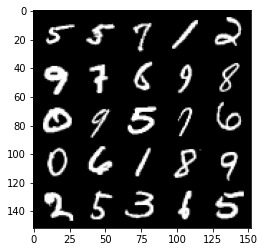

Epoch 183, step 86000: Generator loss: 1.3229023010730738, discriminator loss: 0.4814638331532477


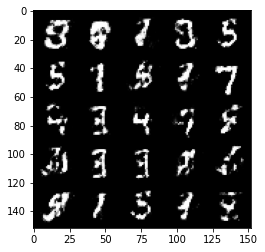

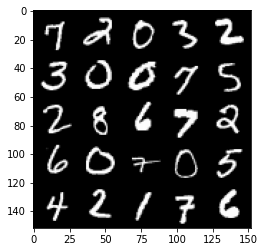

Epoch 184, step 86500: Generator loss: 1.317127629160881, discriminator loss: 0.4746661818623542


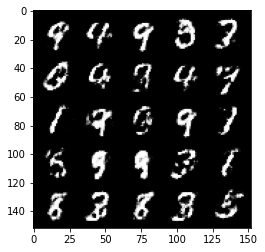

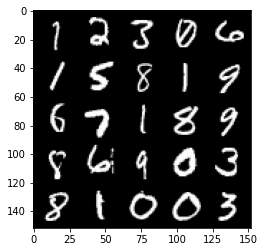

Epoch 185, step 87000: Generator loss: 1.289952509880067, discriminator loss: 0.47101899671554576


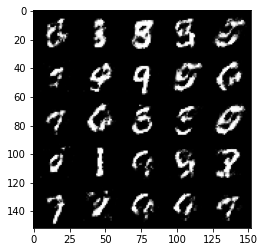

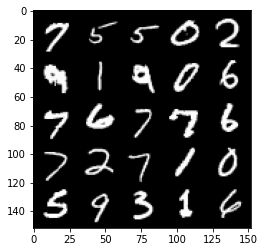

Epoch 186, step 87500: Generator loss: 1.3122980988025676, discriminator loss: 0.46727172446250914


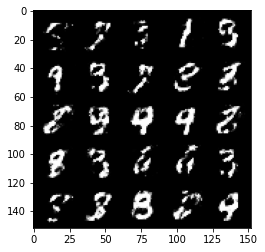

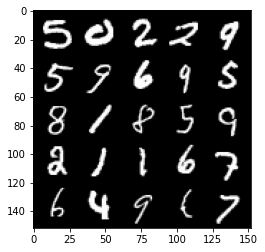

Epoch 187, step 88000: Generator loss: 1.2578133826255788, discriminator loss: 0.47857878917455654


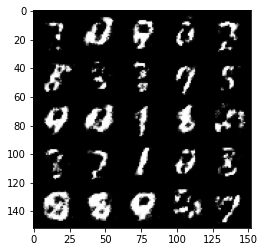

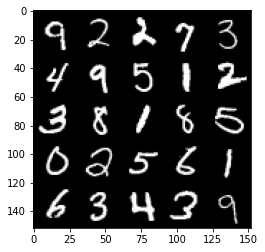

Epoch 188, step 88500: Generator loss: 1.3175047740936285, discriminator loss: 0.45783151245117165


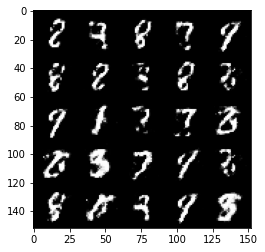

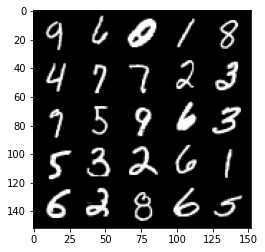

Epoch 189, step 89000: Generator loss: 1.3114180750846853, discriminator loss: 0.46747931414842575


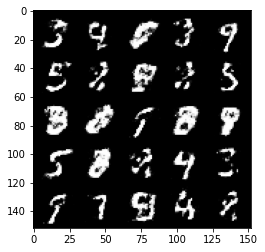

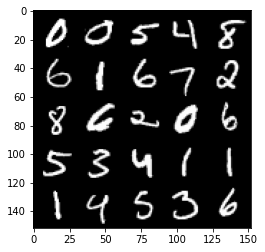

Epoch 190, step 89500: Generator loss: 1.3017533283233633, discriminator loss: 0.4715526039600372


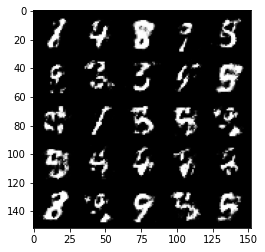

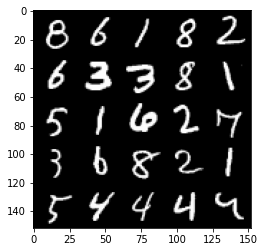

Epoch 191, step 90000: Generator loss: 1.2616950764656072, discriminator loss: 0.48582049131393423


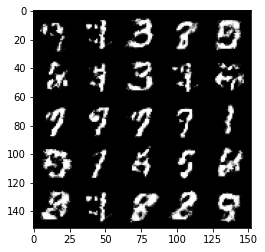

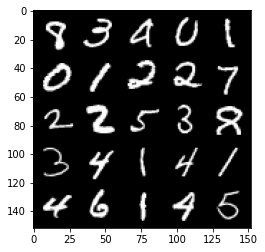

Epoch 192, step 90500: Generator loss: 1.3612268648147596, discriminator loss: 0.4507212690114977


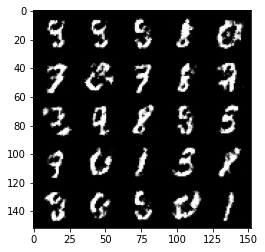

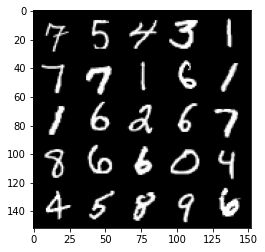

Epoch 194, step 91000: Generator loss: 1.3663404204845429, discriminator loss: 0.45639457833766955


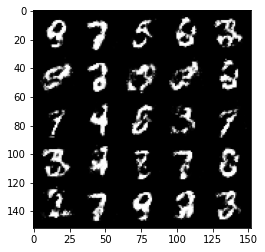

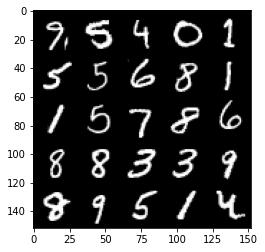

Epoch 195, step 91500: Generator loss: 1.3741119785308862, discriminator loss: 0.4572838892340659


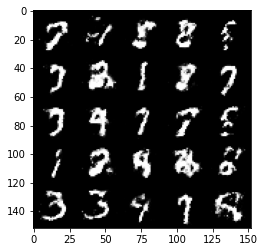

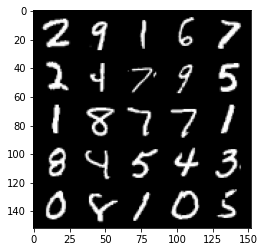

Epoch 196, step 92000: Generator loss: 1.2476993957757947, discriminator loss: 0.482826663196087


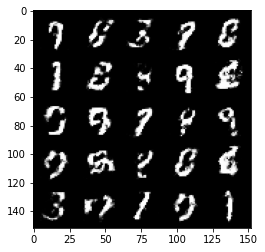

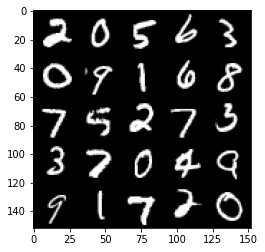

Epoch 197, step 92500: Generator loss: 1.2527260322570795, discriminator loss: 0.49518885141611096


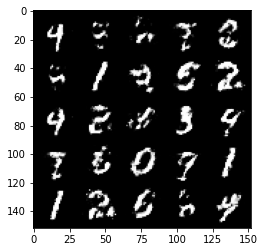

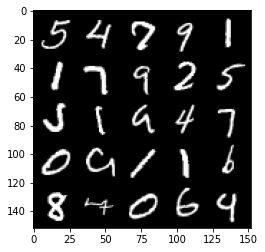

Epoch 198, step 93000: Generator loss: 1.2494933903217311, discriminator loss: 0.4994626991152763


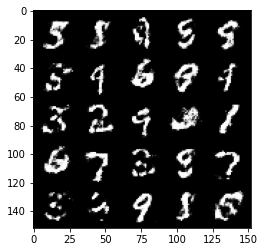

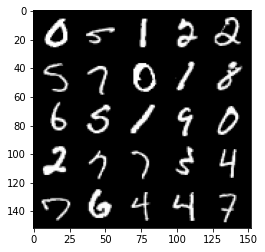

Epoch 199, step 93500: Generator loss: 1.260656484127044, discriminator loss: 0.4861521025300031


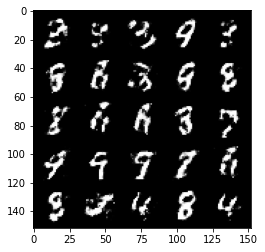

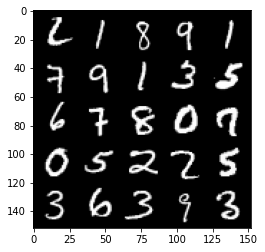

In [28]:
from tqdm.auto import tqdm
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        #zero out grafientes
        gen_opt.zero_grad()

        # calculate generator loss
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)

        #update gradiente
        gen_loss.backward(retain_graph=True)

        #update optimizer
        gen_opt.step()                     

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
